<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introducción-al-Random-Forest" data-toc-modified-id="Introducción-al-Random-Forest-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introducción al <em>Random Forest</em></a></span></li><li><span><a href="#Ajuste-del-modelo-variables-estandarizadas-y-codificadas" data-toc-modified-id="Ajuste-del-modelo-variables-estandarizadas-y-codificadas-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Ajuste del modelo variables estandarizadas y codificadas</a></span></li></ul></div>

In [1]:
# Tratamiento de datos
# ------------------------------------------------------------------------------
import numpy as np
import pandas as pd
from tqdm import tqdm

# Gráficos
# ------------------------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

# Modelado y evaluación
# ------------------------------------------------------------------------------
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score , cohen_kappa_score, roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV

# Configuración warnings
# ------------------------------------------------------------------------------
import warnings
warnings.filterwarnings('ignore')

# Introducción al *Random Forest*

Como vimos con el *Decision Tree* este tipo de algoritmos se pueden aplicar también a modelos logísticos. Lo mismo pasa con los *Random Forest*. Recordemos que estos modelos están formados por un conjunto de *Decision Trees*  o árboles de decisión individuales, cada uno entrenado con un set de datos distintos generados por *bootstrapping*.  En nuestro caso, la prediccion de una nueva casa se obtendrá agregando las predicciones de todos lso árboles individuales que forman el modelo. 

A modo de esquema os dejamos por aquí un diagrama 👇🏽
 


![RandomForest](https://github.com/Adalab/data_imagenes/blob/main/Modulo-3/Rnadom-Forest.png?raw=true)

Como están basados en árboles de decisión lo hiperparámetros que podemos modificar cuando ajustamos en el modelo son los mismo. Recordemos que en los árboles de decisión teníamos muchos hiperparámetros que podíamos modificar, pero los más importantes son: 

- `max_depth`: profundidad máxima que puede alcanzar el árbol.

- `min_samples_split`: número mínimo de observaciones que debe de tener un nodo para que pueda dividirse. Si es un valor decimal se interpreta como fracción del total de observaciones de entrenamiento *ceil*(*min_samples_split* * *n_samples*).

- `min_samples_leaf`: número mínimo de observaciones que debe de tener cada uno de los nodos hijos para que se produzca la división. Si es un valor decimal se interpreta como fracción del total de observaciones de entrenamiento *ceil*(*min_samples_split* * *n_samples*).

- `max_leaf_nodes`: número máximo de nodos terminales.

- `random_state`: semilla para que los resultados sean reproducibles. Tiene que ser un valor entero.



Igual que en las lecciones anteriores, en este jupyter solo usaremos dos set de datos:  

- El de las variables codificadas y estandarizadas

- El de las variables codificadas y sin estandarizar. 

Peeero .... 👇🏽👇🏽

📌 **NOTA**  El ejercicio de la clase invertida, será ajustar el algoritmo de *Random Forest* con esos conjuntos de datos (los datos con la corrección del desbalanceo). Esta dinámica la seguiremos a lo largo de las siguientes lecciones, de tal forma que iremos comparando cada modelo en función de su preprocesamiento.  

Dicha toda esta teória pongámonos manos a la obra! 

#  Ajuste del modelo variables estandarizadas y codificadas

In [2]:
df_esta = pd.read_csv("../files/titanic_esta_enco.csv", index_col = 0)
df_esta.head()

,survived,pclass,sex,age,fare,num_familiar,embarked_C,embarked_Q,embarked_S,maturity_adult,maturity_child,adult_male_False,adult_male_True,alone_False,alone_True
0,0,3,0,-0.525629,-0.850402,0.757803,0,0,1,1,0,0,1,1,0
1,1,1,1,0.809187,3.775012,0.757803,1,0,0,1,0,1,0,1,0
2,1,3,1,-0.191925,-0.801644,-0.643861,0,0,1,1,0,1,0,0,1
3,1,1,1,0.558909,2.461550,0.757803,0,0,1,1,0,1,0,1,0
4,0,3,0,0.558909,-0.792614,-0.643861,0,0,1,1,0,0,1,0,1


In [3]:
# separamos los datos en X e y

X1 = df_esta.drop("survived", axis = 1)
y1 = df_esta["survived"]

In [4]:
# y dividir nuestros datos en train y test para poder evaluar la bondad de nuestro modelo

x_train, x_test, y_train, y_test = train_test_split(X1, y1, test_size = 0.2, random_state = 42)

Como esta basado en el *Decision Tree*, usaremos los hiperparámetros que seleccionamos en la lección anterior 👇🏽👇🏽

In [5]:
# lo primero que tenemos que hacer es definir un diccionario con los hiperparámetros que queremos modificar y los valores que queremos 

param = {"max_depth": [2,4, 6, 10, 12, 14], # teniendo en cuenta que teníamos overfitting tendremos que reducir la profundidad del modelo, la nuestra anterior era de 17. Bajaremos mucho este valor ya que teníamos un overfitting muy claro
        "max_features": [1,2,3,4],# calculamos en celdas anteriores, probaremos a hacer el modelo como una variable, 2, 3 y 4. Ponemos como límite el 4 ya que es el resultado de la raiz cuadrada. 
        # estos dos hiperparámetros son más difíciles de definir, pero usualmente se suelen elegir los siguientes valores
        "min_samples_split": [10, 50, 100],
        "min_samples_leaf": [10,50,100]} 

In [6]:
gs_rf = GridSearchCV(
            estimator=RandomForestClassifier(random_state=42), # tipo de modelo que queremos hacer
            param_grid= param, # que hiperparámetros queremos que testee
            cv=10, # crossvalidation que aprendimos en la lección de regresión lineal intro. 
            verbose=-1) # para que no nos printee ningún mensaje en pantalla
        

In [7]:
# ajustamos el modelo que acabamos de definir en el GridSearch
# 🚨 Esta celda puede tardar en ejecutarse

gs_rf.fit(x_train, y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [2, 4, 6, 10, 12, 14],
                         'max_features': [1, 2, 3, 4],
                         'min_samples_leaf': [10, 50, 100],
                         'min_samples_split': [10, 50, 100]},
             verbose=-1)

In [8]:
# saquemos ahora cual es nuestro mejor bosque

bosque = gs_rf.best_estimator_
bosque

RandomForestClassifier(max_depth=6, max_features=4, min_samples_leaf=10,
                       min_samples_split=10, random_state=42)


  0%|          | 0/100 [00:00<?, ?it/s]

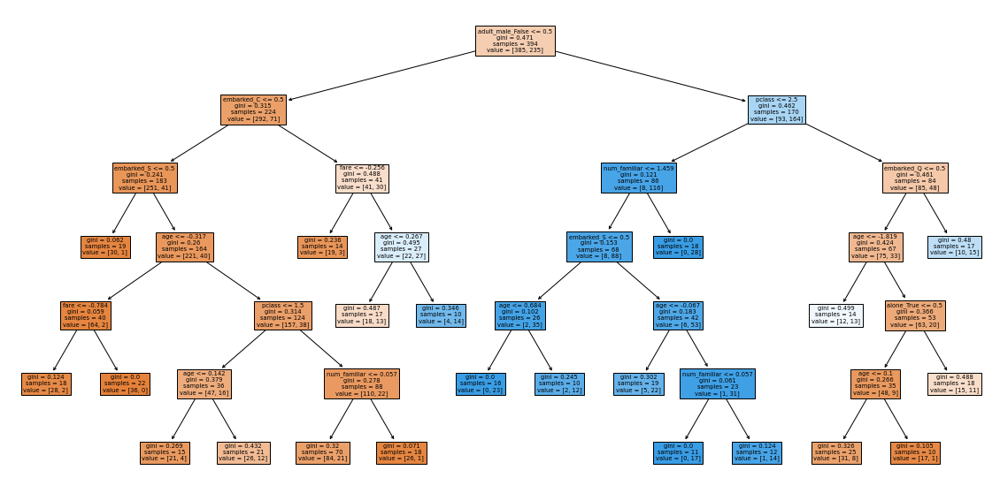


  1%|          | 1/100 [00:03<05:49,  3.53s/it]

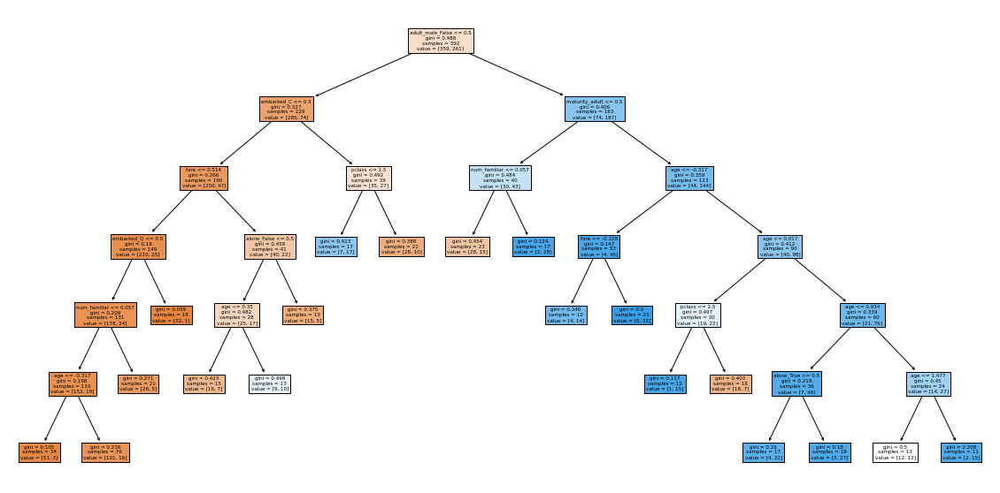


  2%|▏         | 2/100 [00:06<05:25,  3.32s/it]

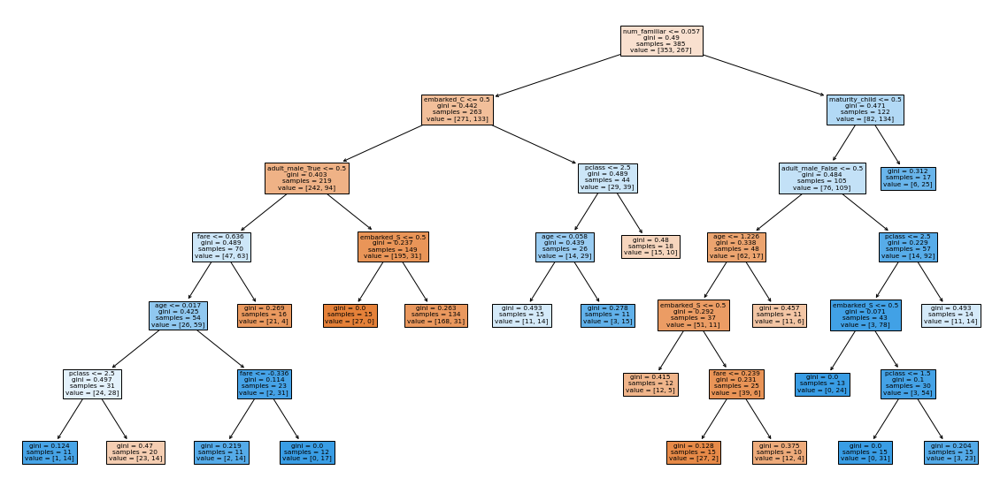


  3%|▎         | 3/100 [00:09<05:12,  3.23s/it]

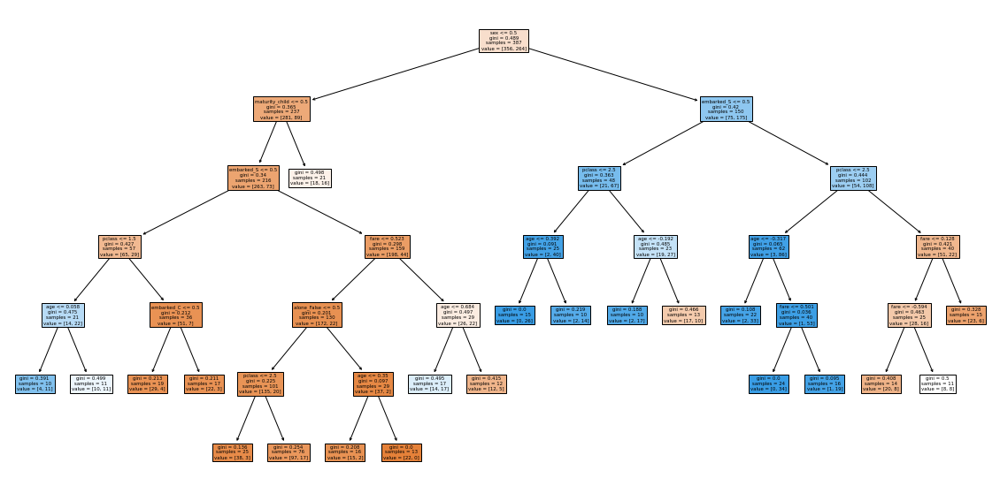


  4%|▍         | 4/100 [00:13<05:20,  3.34s/it]

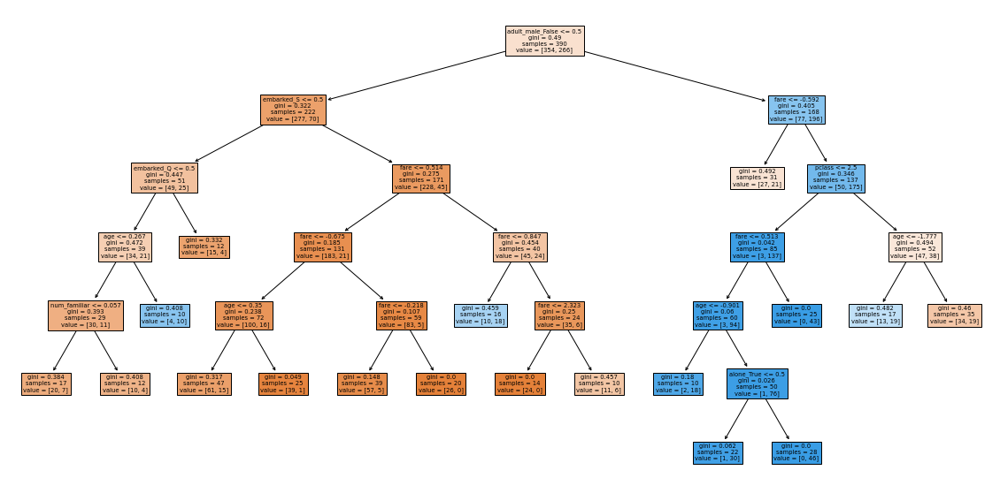


  5%|▌         | 5/100 [00:16<05:05,  3.22s/it]

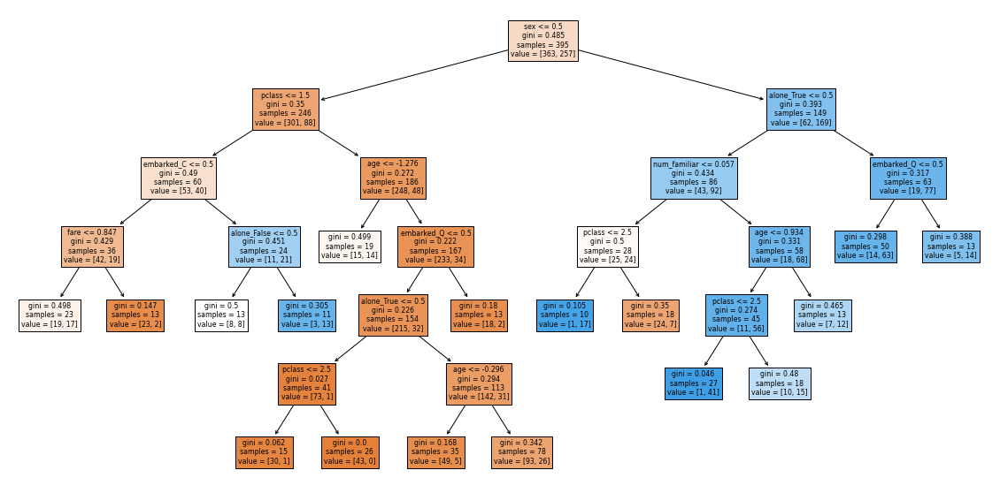


  6%|▌         | 6/100 [00:19<04:52,  3.11s/it]

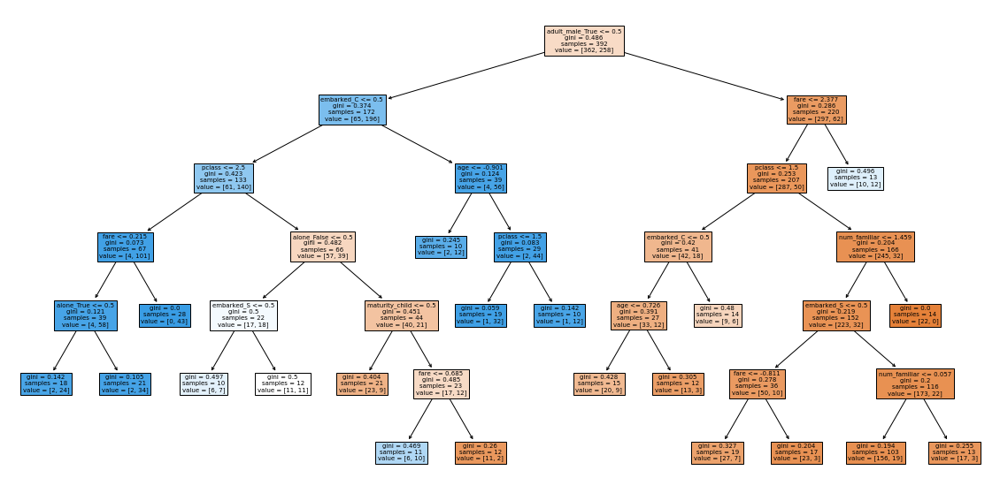


  7%|▋         | 7/100 [00:22<04:56,  3.18s/it]

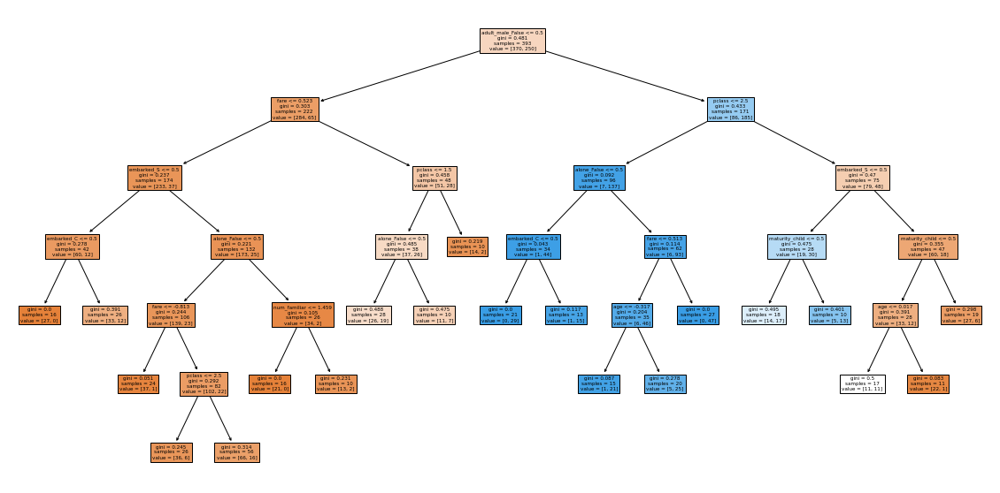


  8%|▊         | 8/100 [00:25<04:56,  3.22s/it]

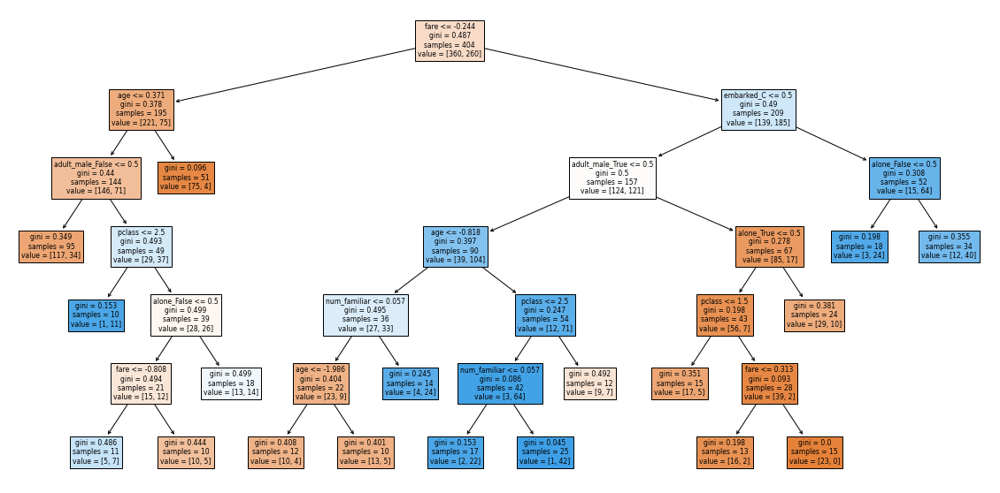


  9%|▉         | 9/100 [00:28<04:50,  3.19s/it]

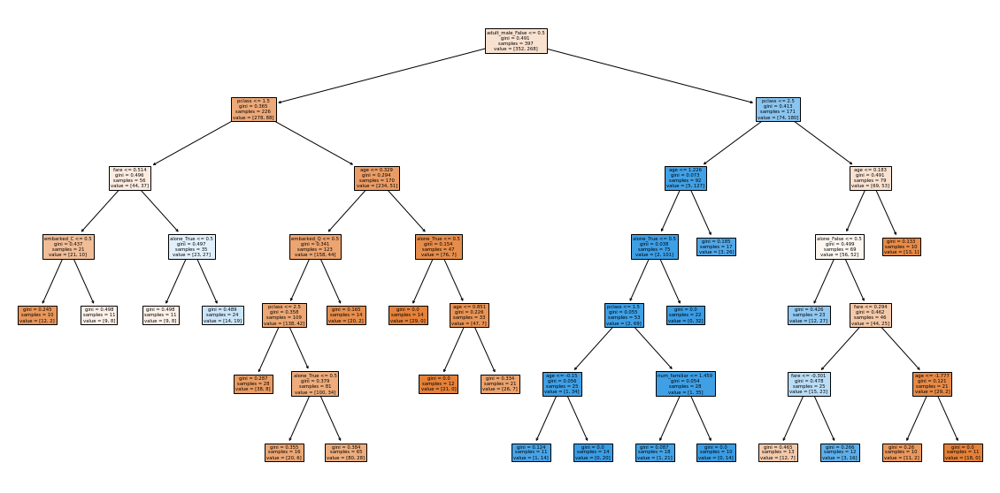


 10%|█         | 10/100 [00:32<05:03,  3.37s/it]

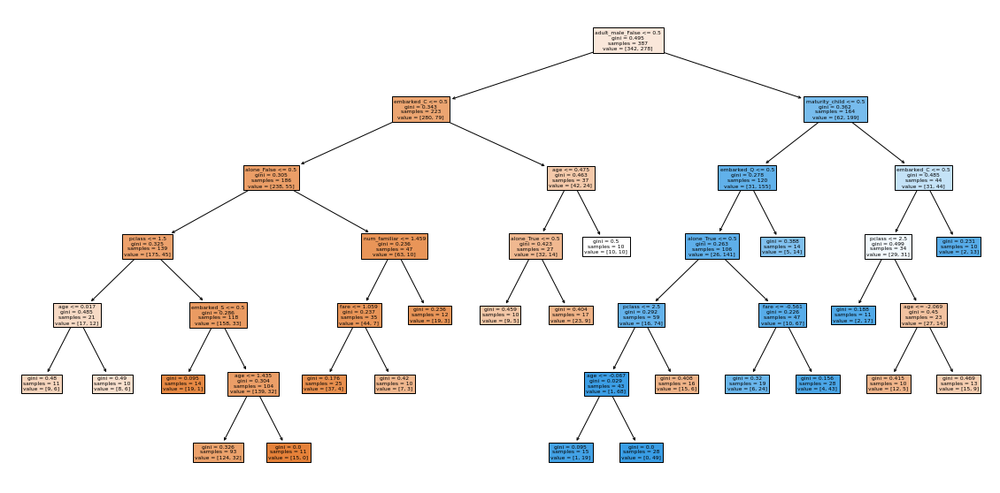


 11%|█         | 11/100 [00:36<05:05,  3.43s/it]

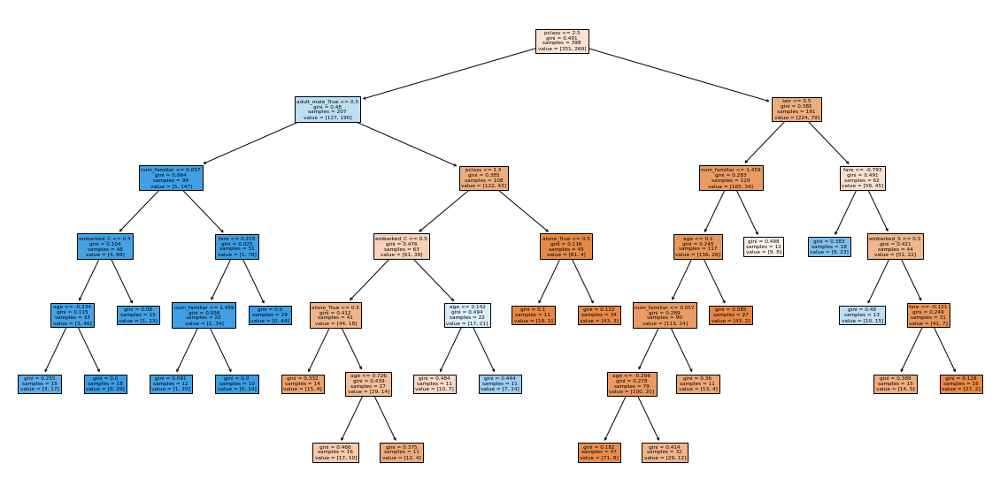


 12%|█▏        | 12/100 [00:39<05:06,  3.48s/it]

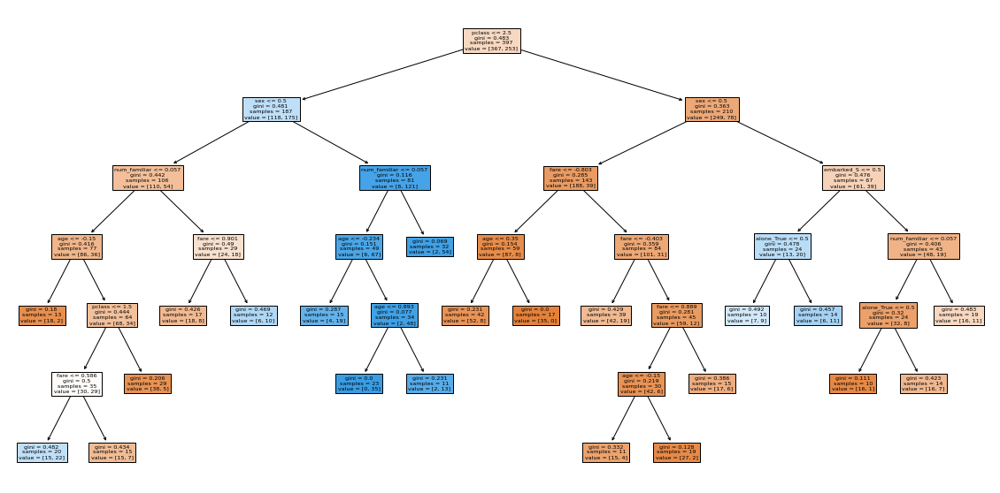


 13%|█▎        | 13/100 [00:43<05:01,  3.46s/it]

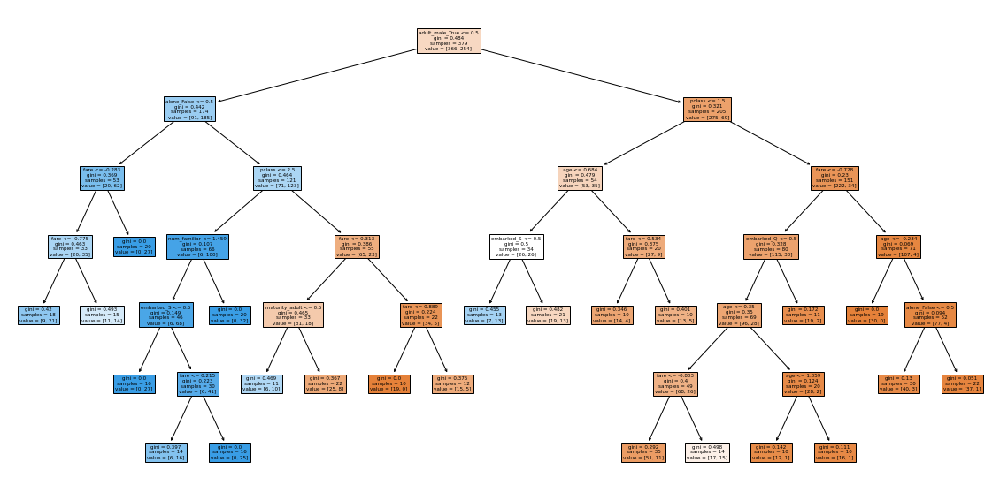


 14%|█▍        | 14/100 [00:47<05:05,  3.55s/it]

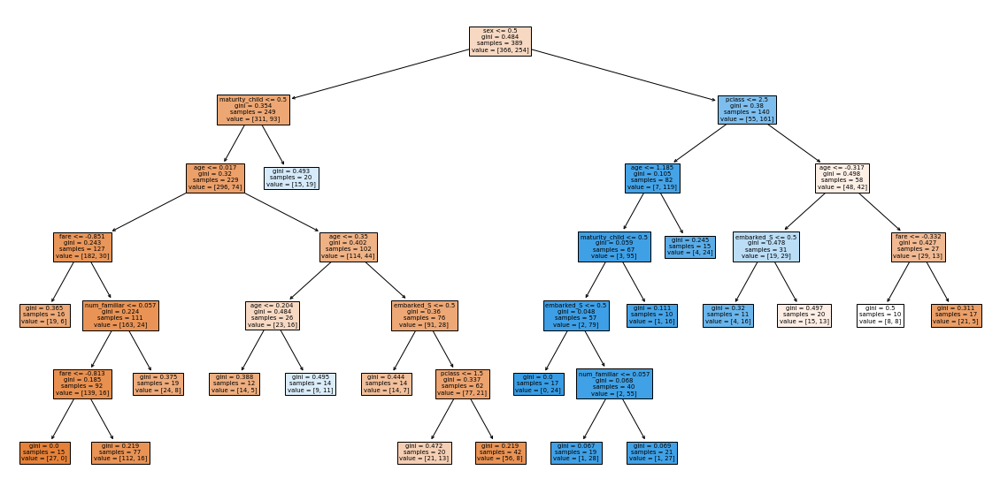


 15%|█▌        | 15/100 [00:50<04:50,  3.42s/it]

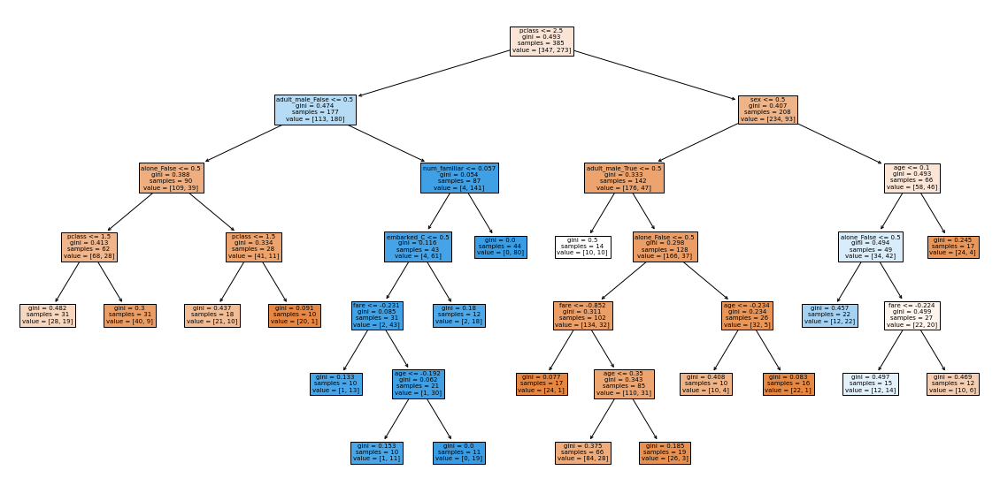


 16%|█▌        | 16/100 [00:53<04:42,  3.37s/it]

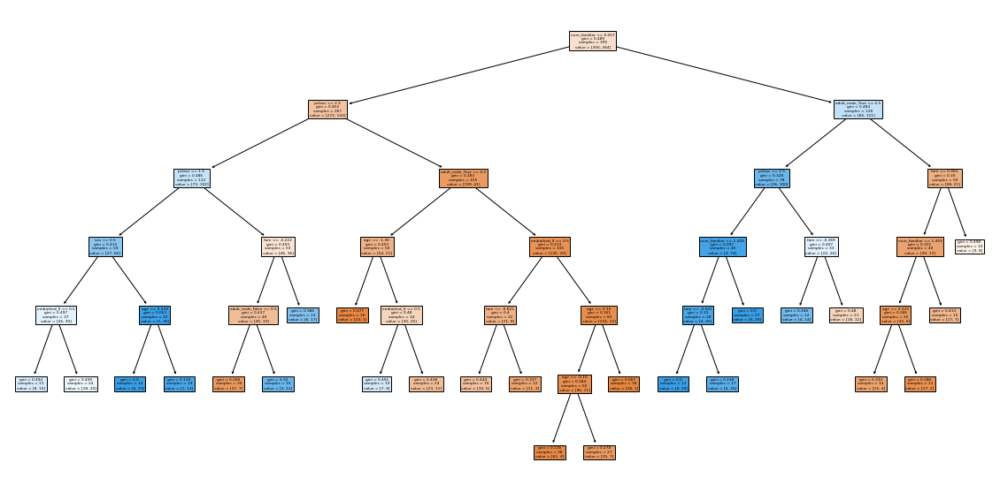


 17%|█▋        | 17/100 [00:57<04:49,  3.49s/it]

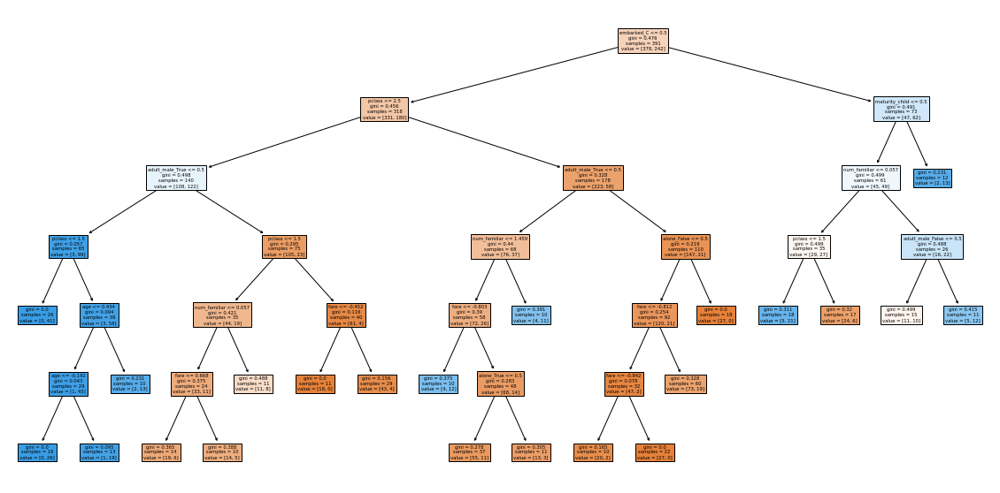


 18%|█▊        | 18/100 [00:59<04:22,  3.21s/it]

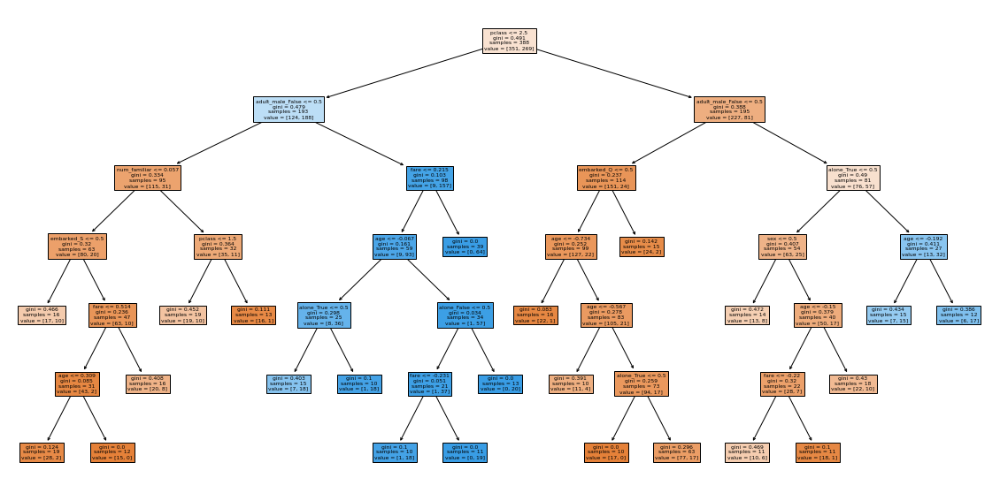


 19%|█▉        | 19/100 [01:01<03:47,  2.81s/it]

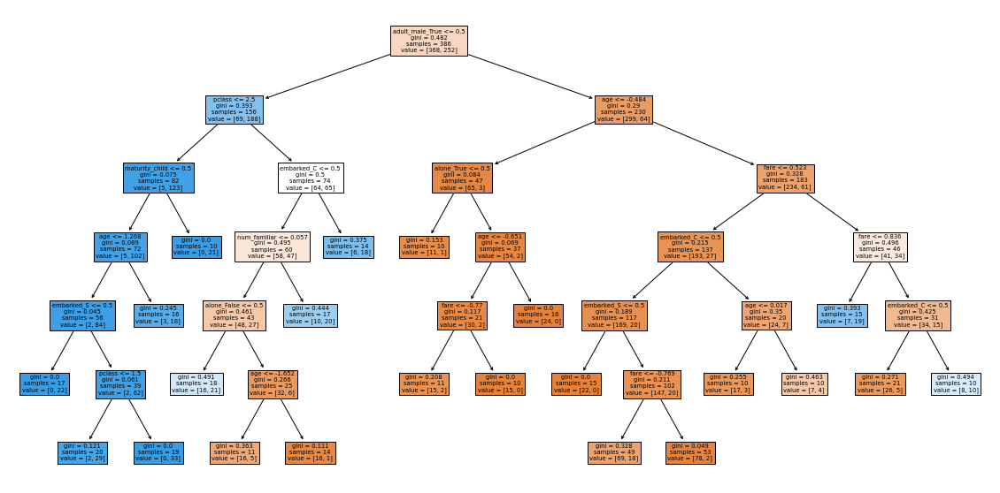


 20%|██        | 20/100 [01:04<03:37,  2.72s/it]

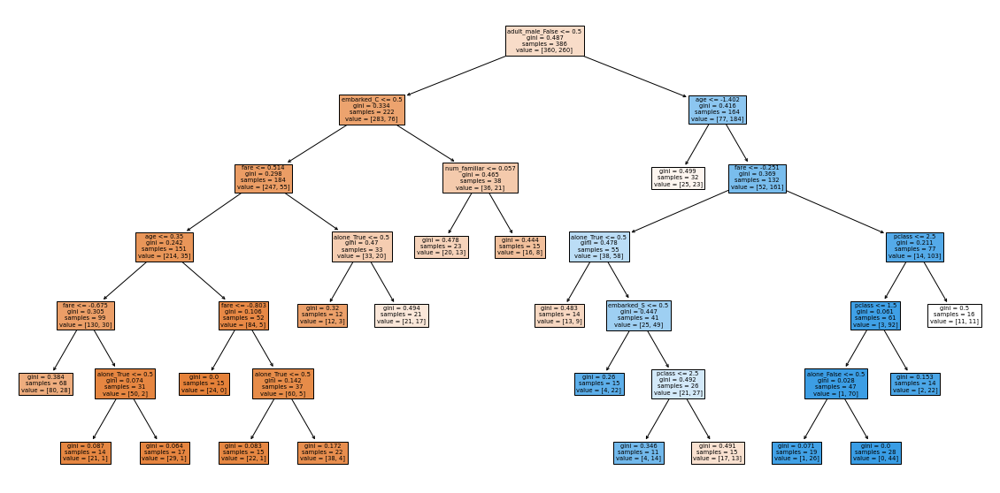


 21%|██        | 21/100 [01:06<03:16,  2.48s/it]

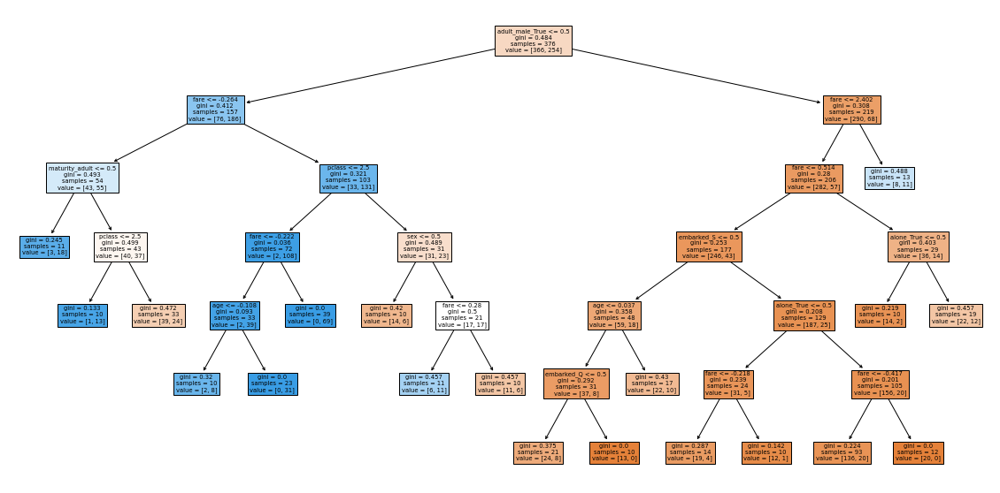


 22%|██▏       | 22/100 [01:08<03:16,  2.52s/it]

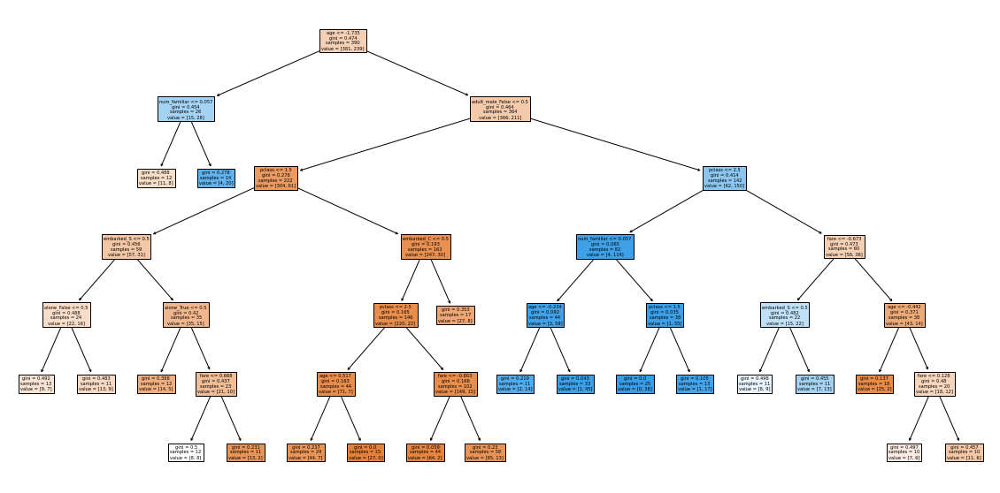


 23%|██▎       | 23/100 [01:11<03:10,  2.48s/it]

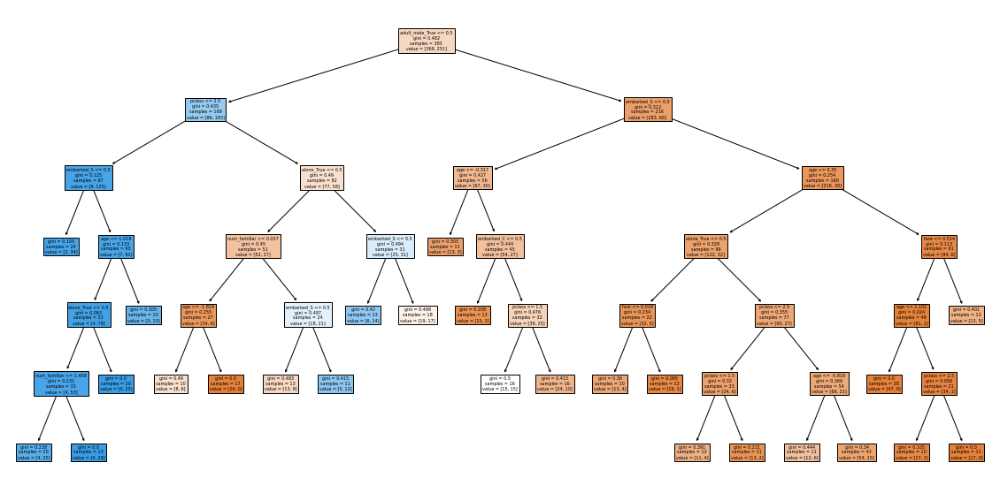


 24%|██▍       | 24/100 [01:15<03:43,  2.94s/it]

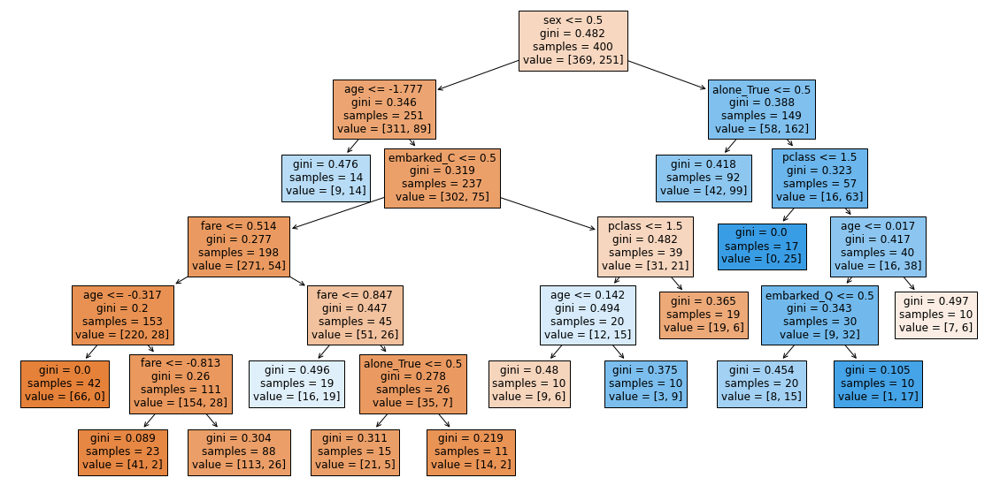


 25%|██▌       | 25/100 [01:17<03:32,  2.84s/it]

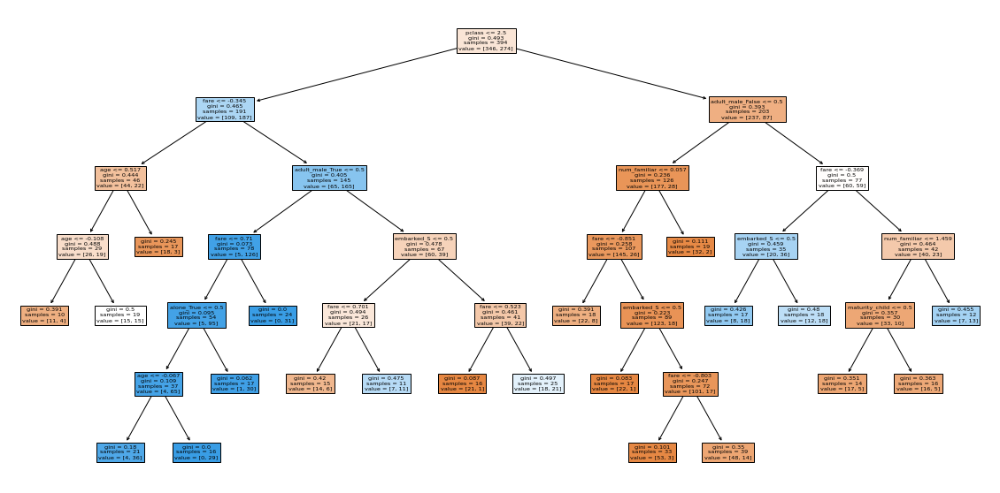


 26%|██▌       | 26/100 [01:21<03:45,  3.05s/it]

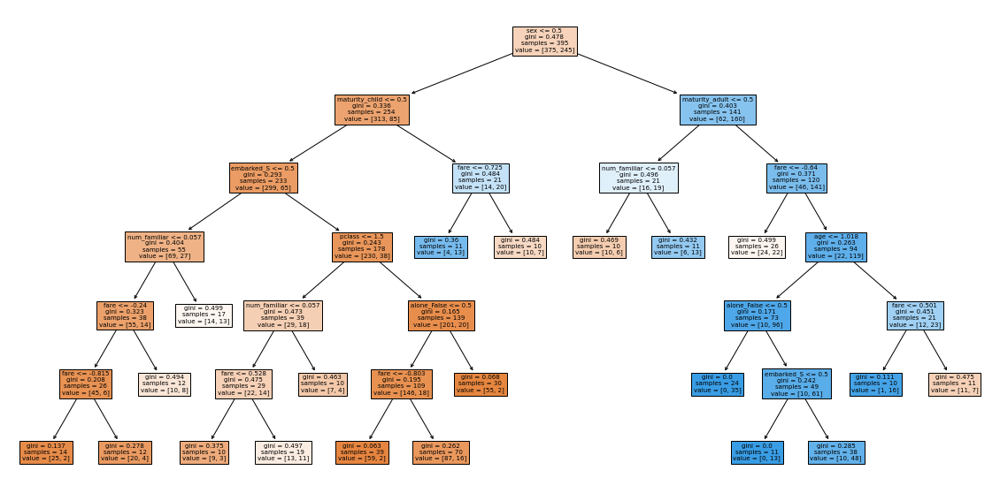


 27%|██▋       | 27/100 [01:24<03:49,  3.14s/it]

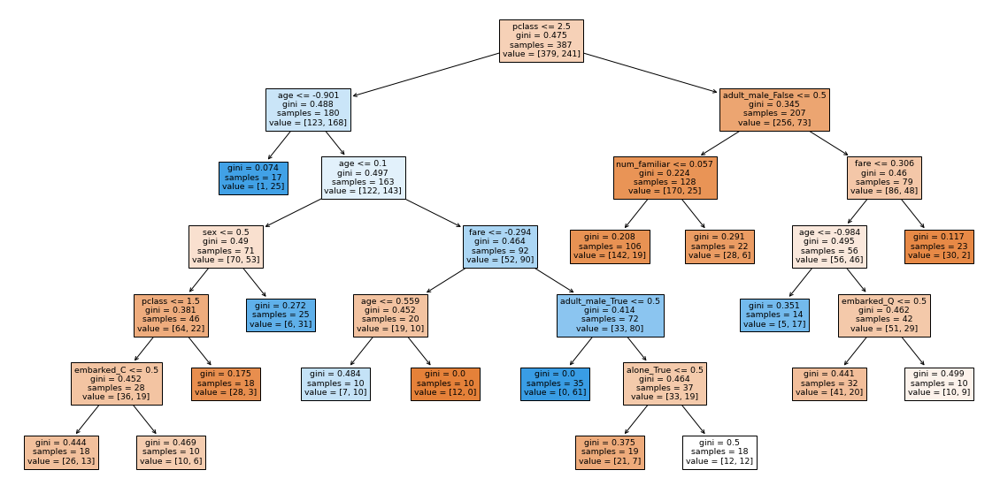


 28%|██▊       | 28/100 [01:27<03:36,  3.01s/it]

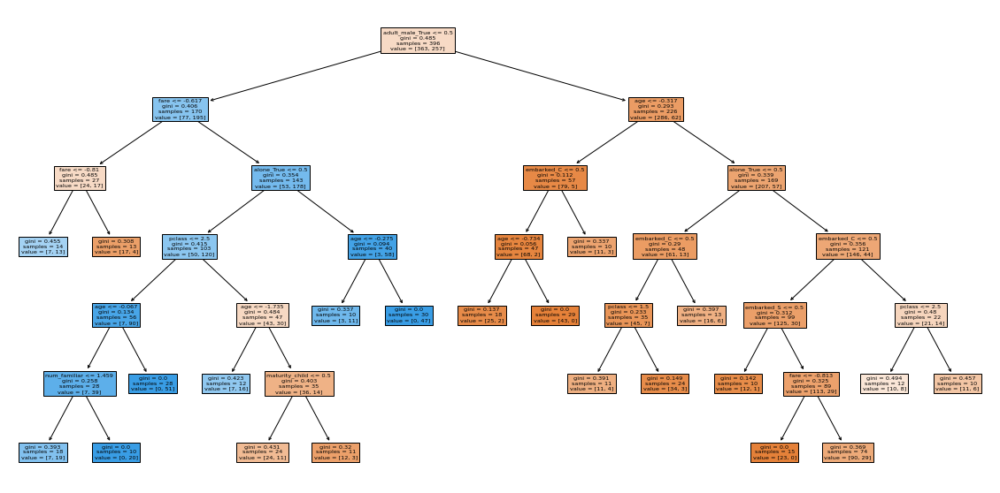


 29%|██▉       | 29/100 [01:30<03:44,  3.16s/it]

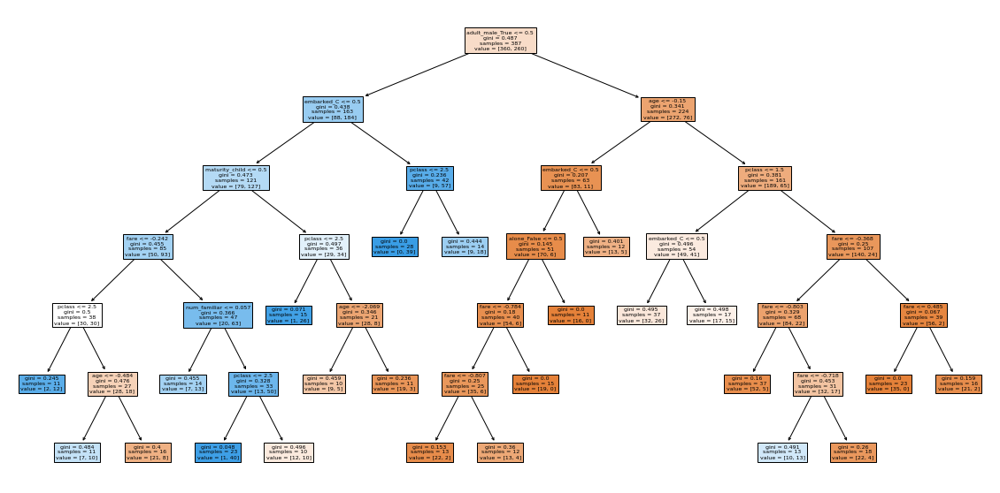


 30%|███       | 30/100 [01:34<03:58,  3.40s/it]

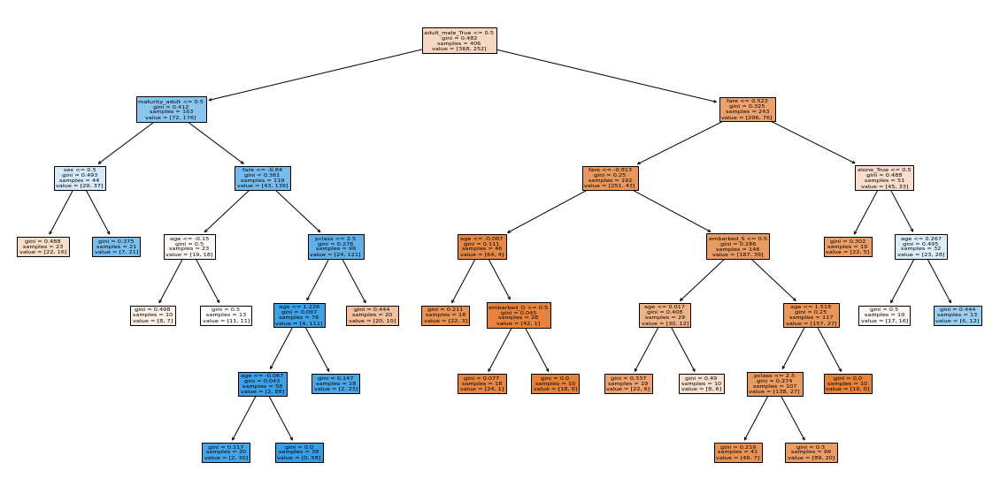


 31%|███       | 31/100 [01:37<03:50,  3.35s/it]

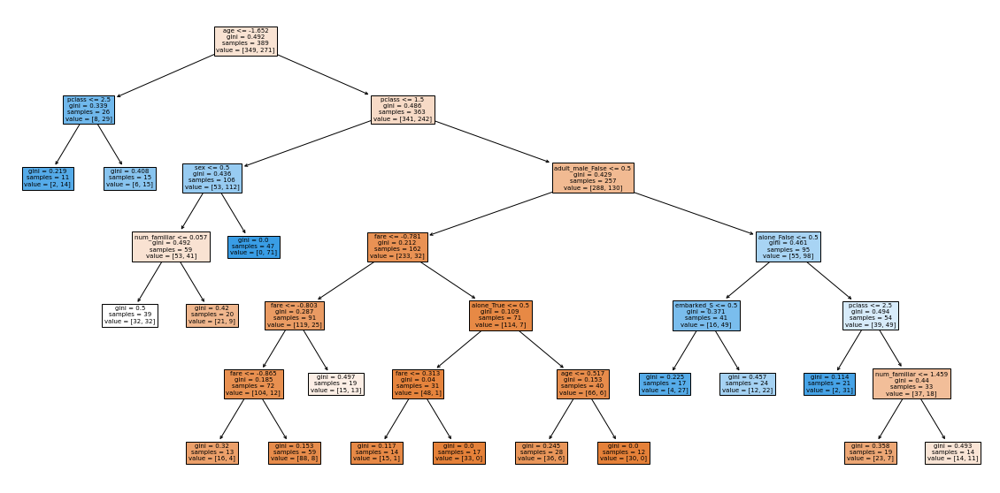


 32%|███▏      | 32/100 [01:40<03:38,  3.22s/it]

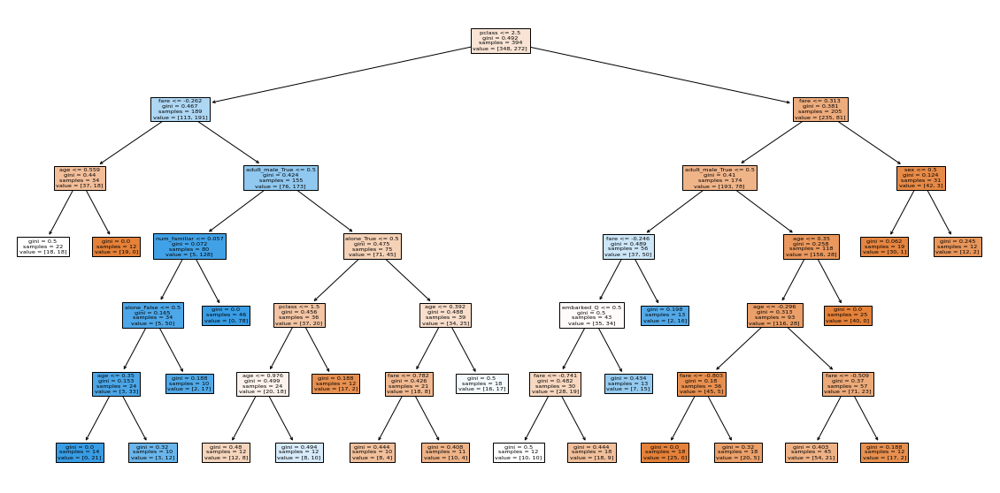


 33%|███▎      | 33/100 [01:44<03:41,  3.30s/it]

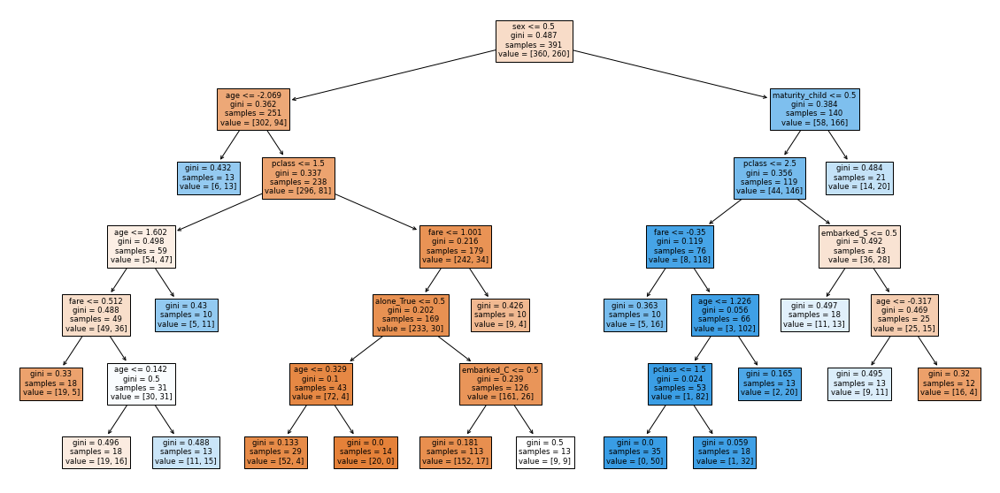


 34%|███▍      | 34/100 [01:47<03:31,  3.20s/it]

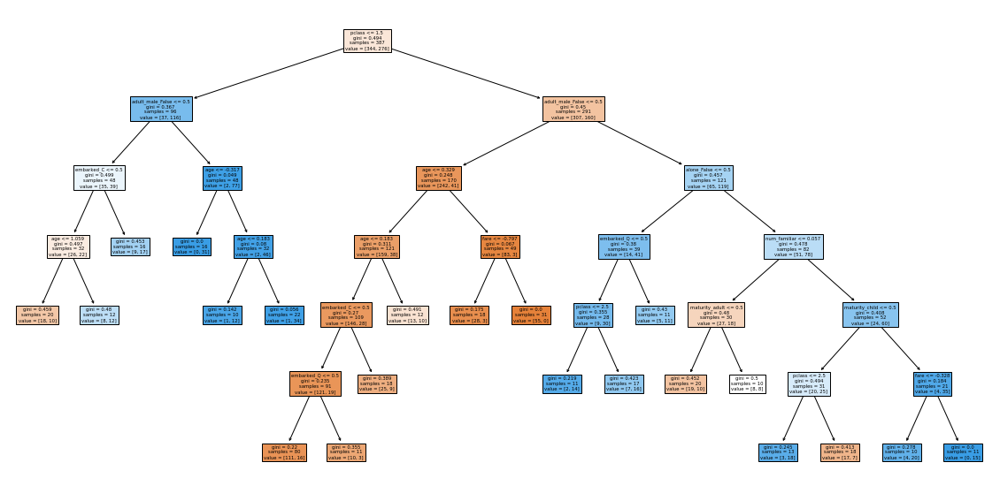


 35%|███▌      | 35/100 [01:51<03:36,  3.33s/it]

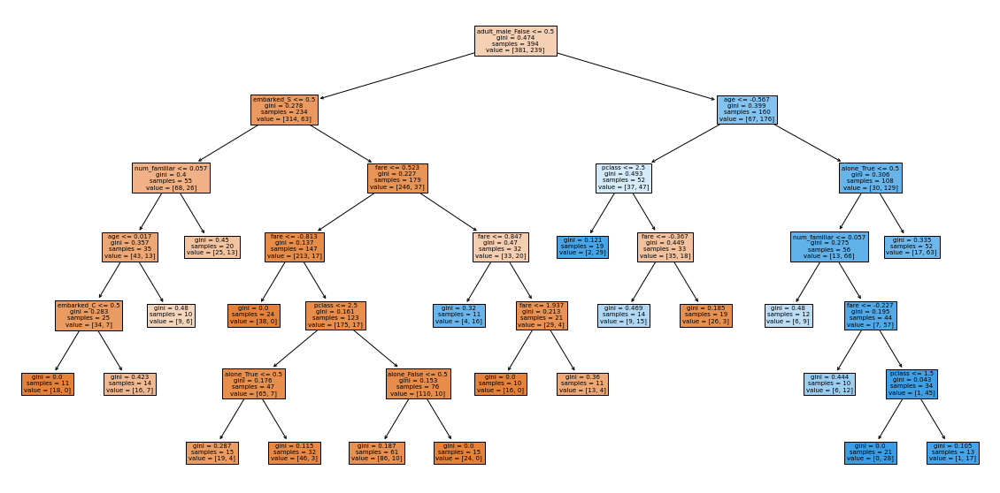


 36%|███▌      | 36/100 [01:54<03:34,  3.35s/it]

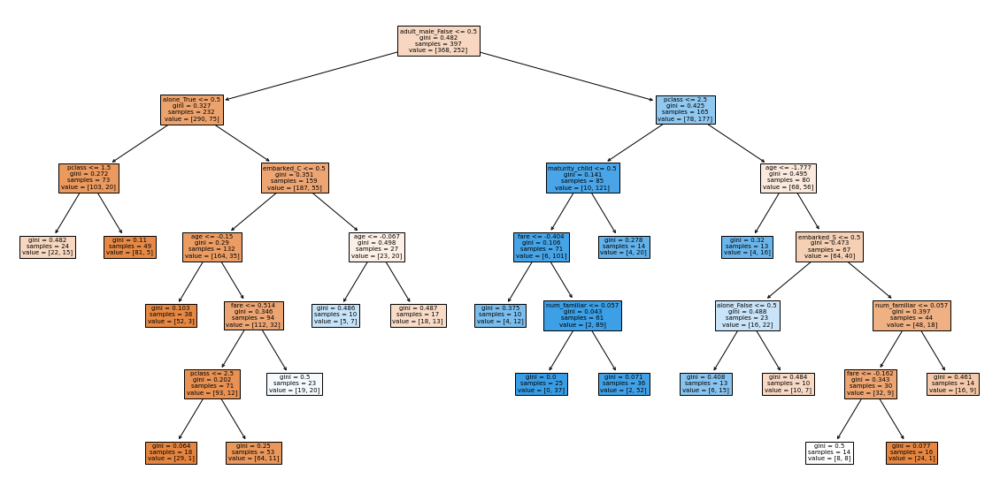


 37%|███▋      | 37/100 [01:57<03:23,  3.23s/it]

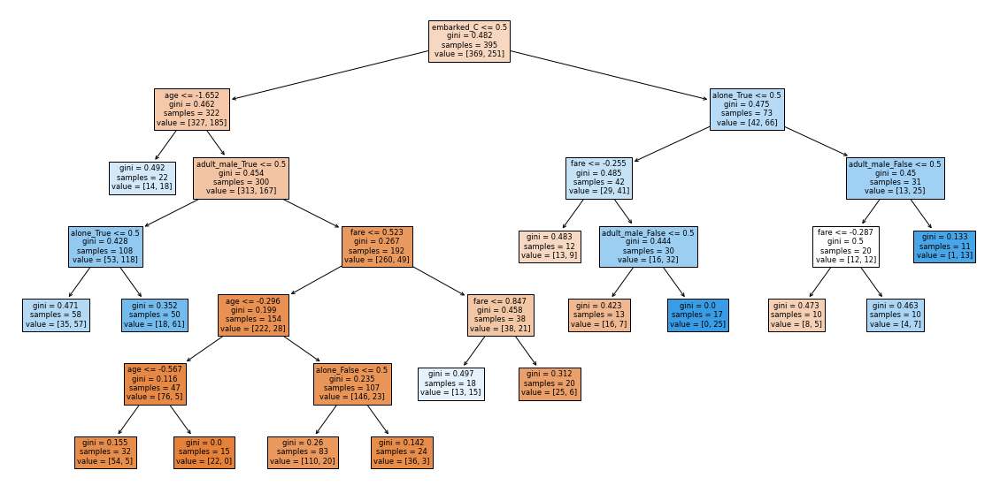


 38%|███▊      | 38/100 [01:59<03:07,  3.03s/it]

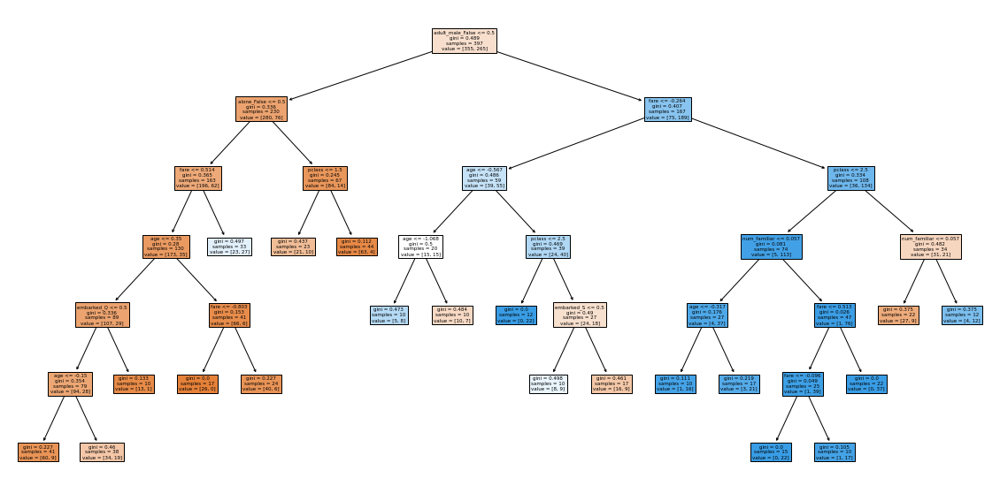


 39%|███▉      | 39/100 [02:03<03:06,  3.05s/it]

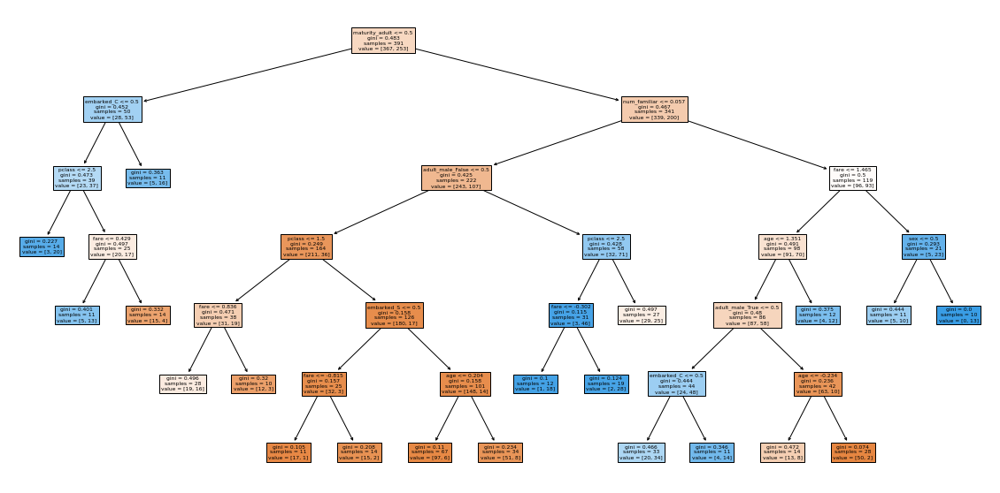


 40%|████      | 40/100 [02:06<03:10,  3.17s/it]

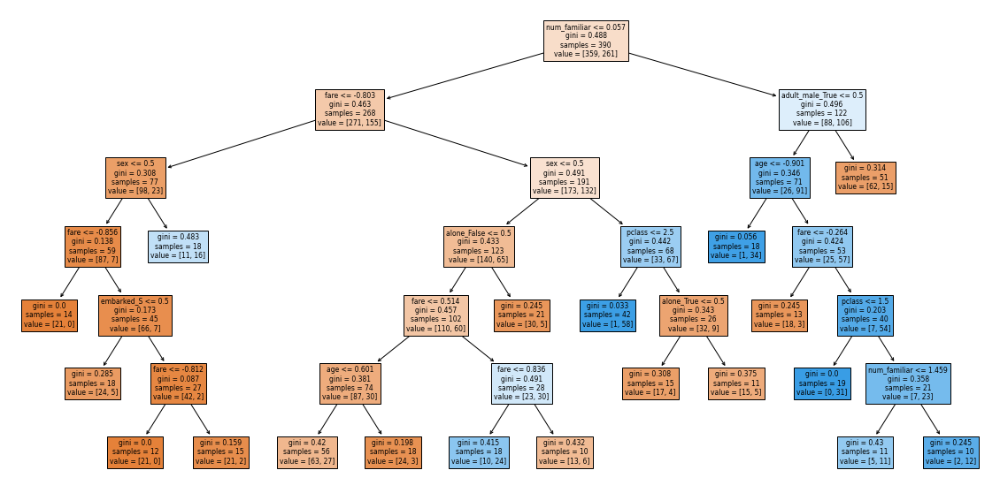


 41%|████      | 41/100 [02:09<03:02,  3.09s/it]

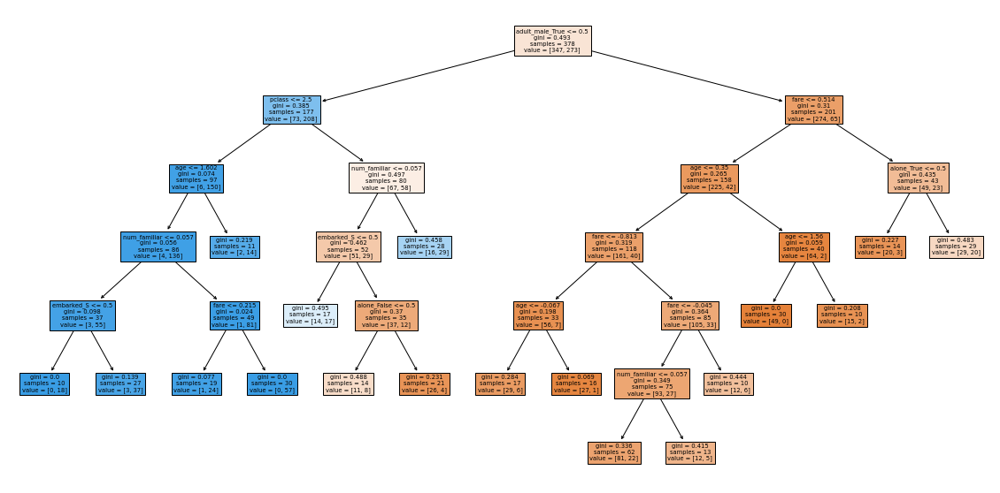


 42%|████▏     | 42/100 [02:12<02:58,  3.08s/it]

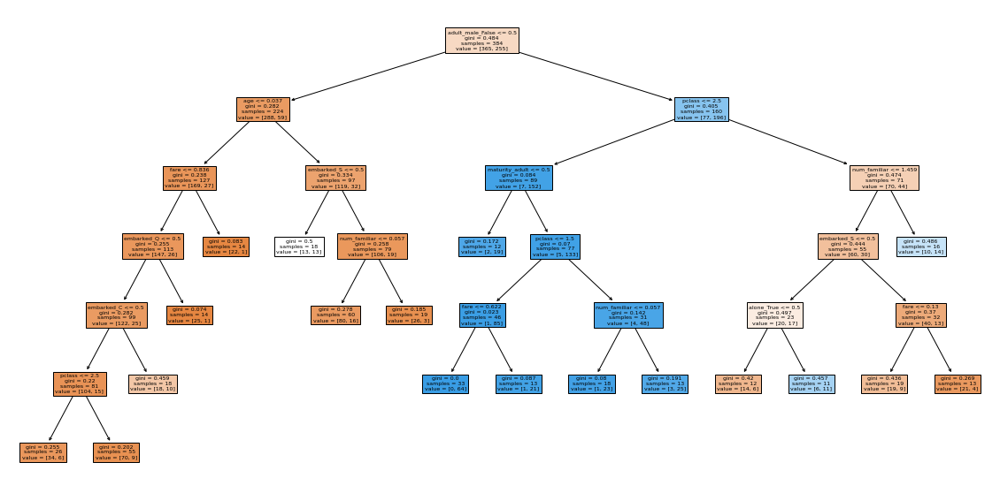


 43%|████▎     | 43/100 [02:15<02:55,  3.08s/it]

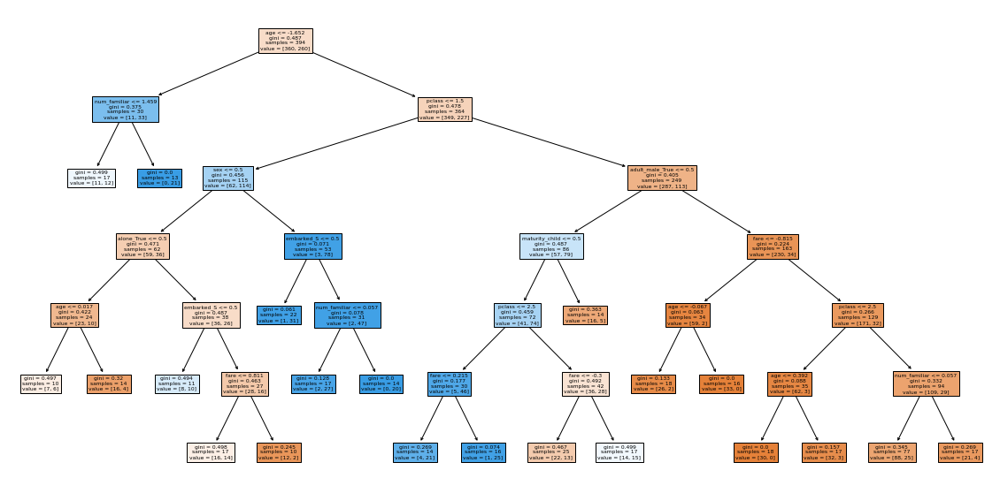


 44%|████▍     | 44/100 [02:19<03:02,  3.26s/it]

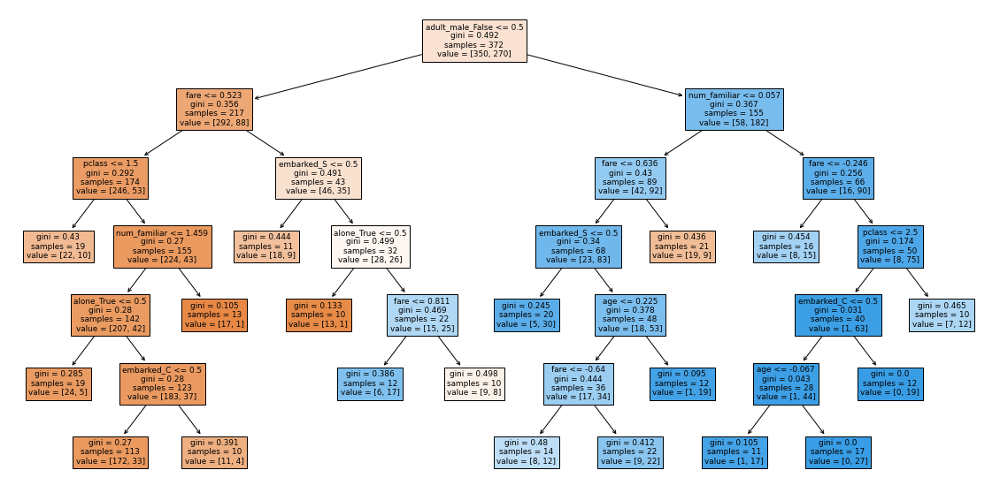


 45%|████▌     | 45/100 [02:22<02:59,  3.26s/it]

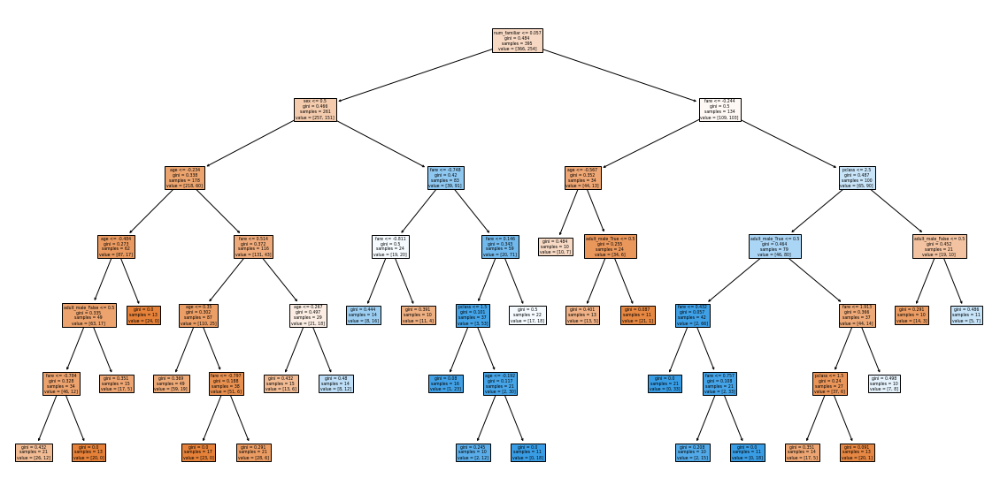


 46%|████▌     | 46/100 [02:26<03:16,  3.63s/it]

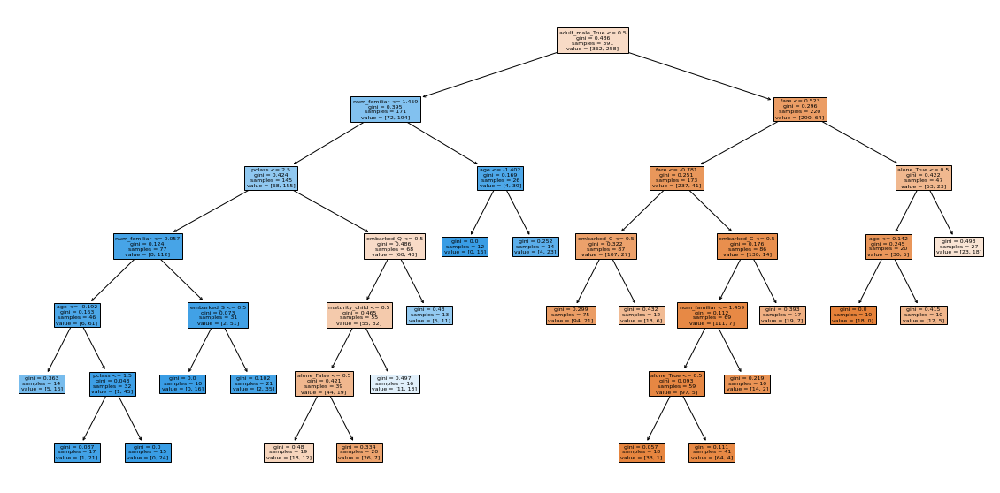


 47%|████▋     | 47/100 [02:30<03:08,  3.56s/it]

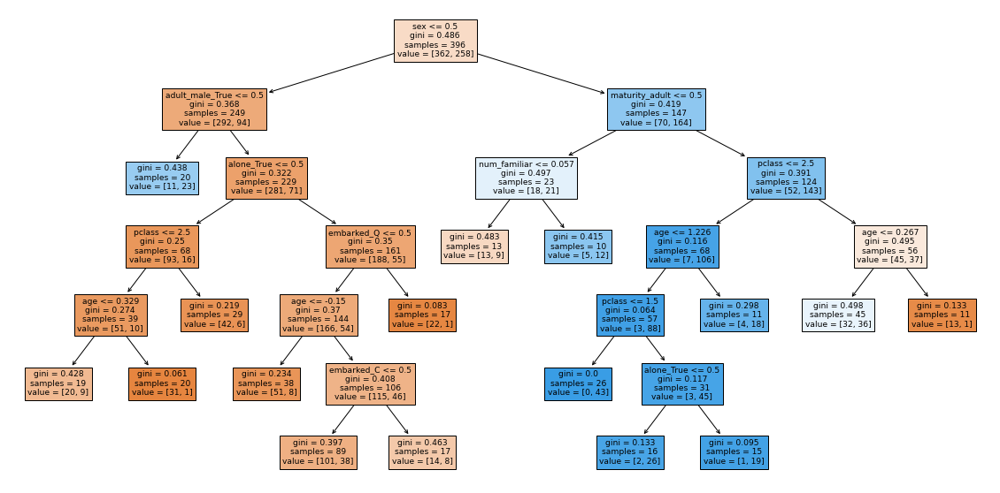


 48%|████▊     | 48/100 [02:32<02:50,  3.29s/it]

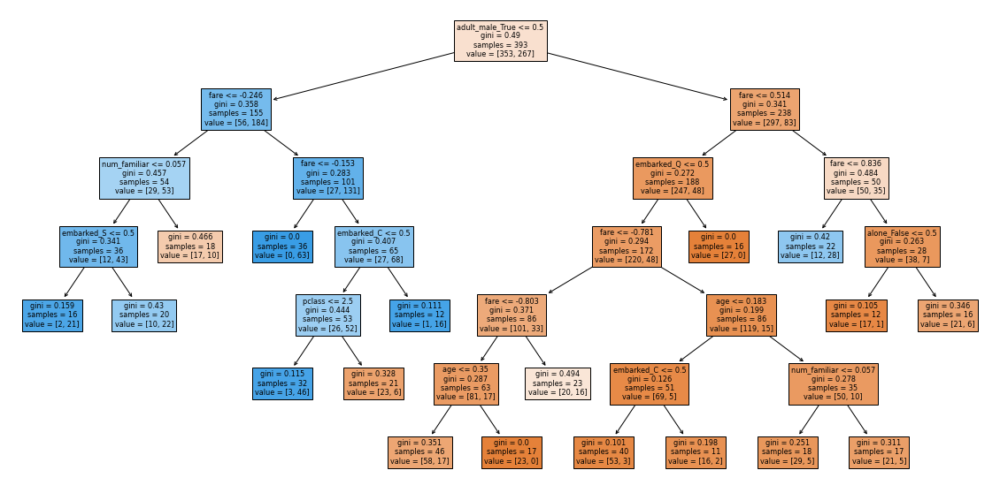


 49%|████▉     | 49/100 [02:35<02:39,  3.14s/it]

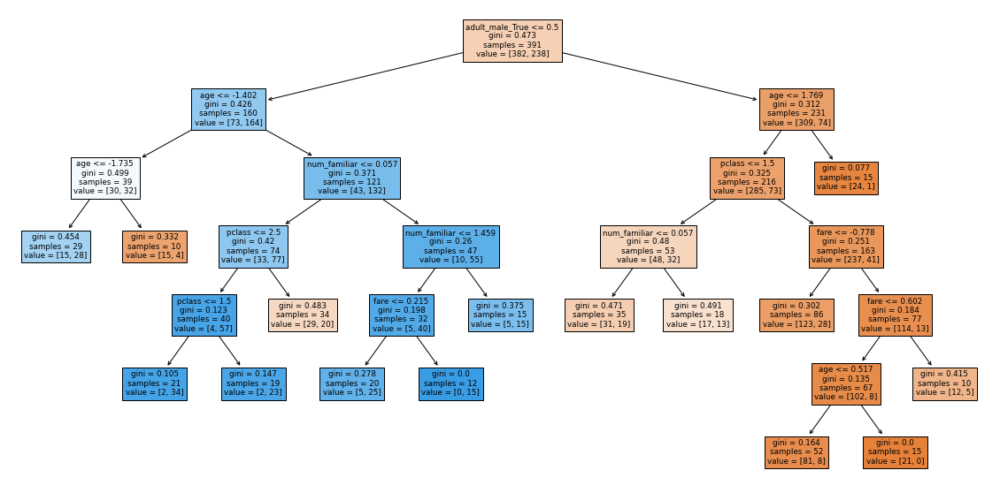


 50%|█████     | 50/100 [02:38<02:28,  2.97s/it]

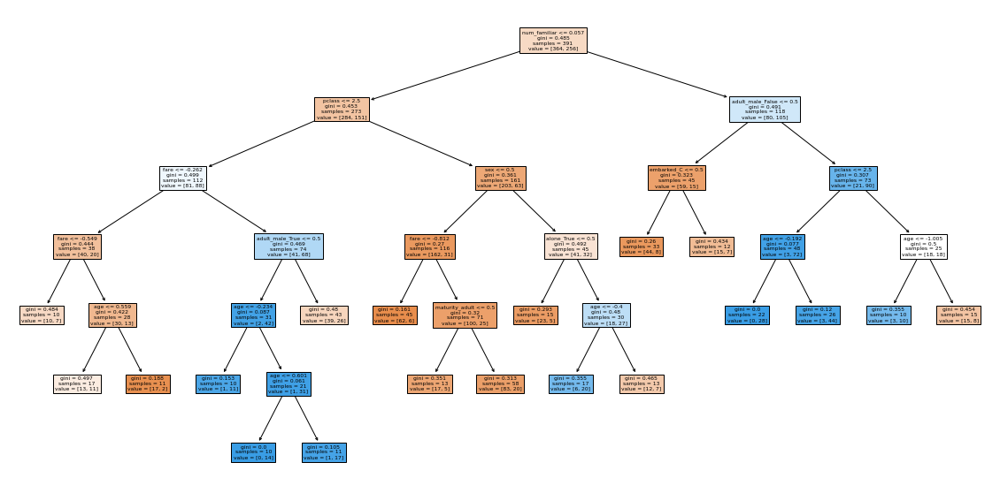


 51%|█████     | 51/100 [02:41<02:28,  3.04s/it]

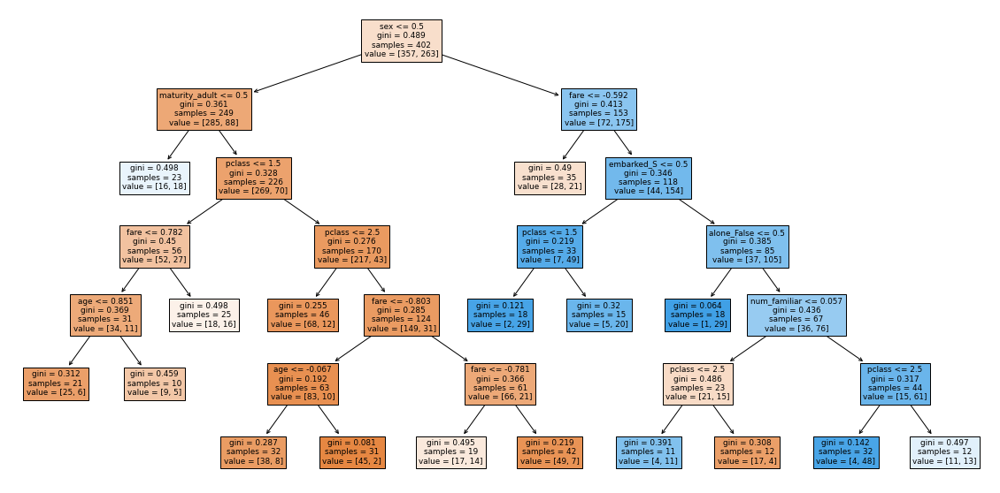


 52%|█████▏    | 52/100 [02:44<02:26,  3.05s/it]

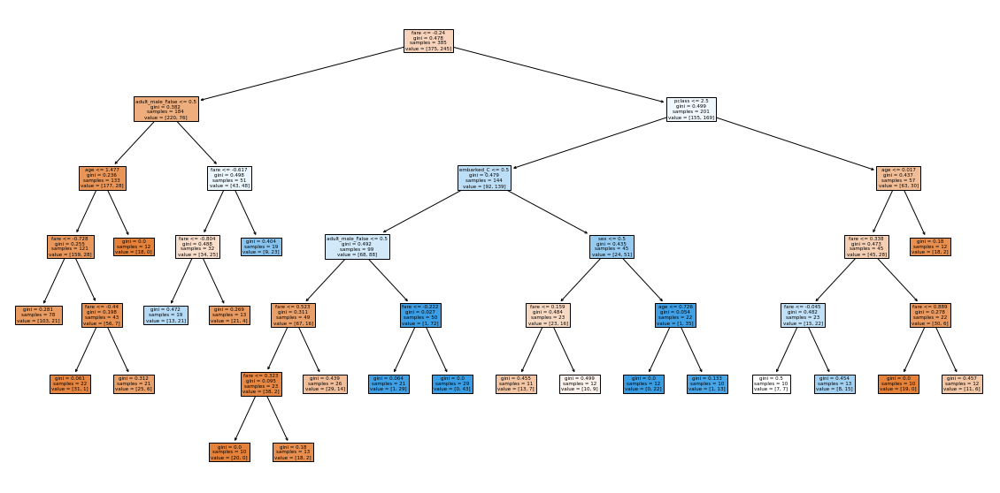


 53%|█████▎    | 53/100 [02:46<02:04,  2.64s/it]

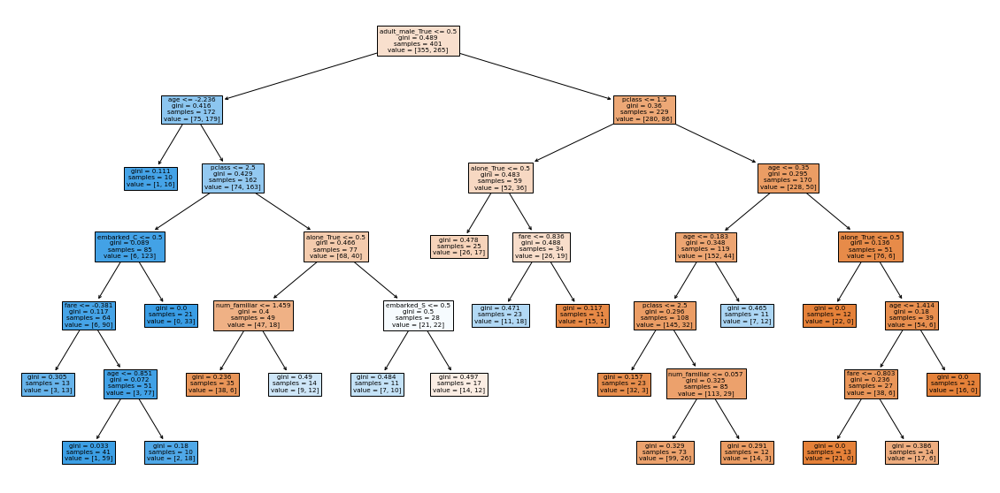


 54%|█████▍    | 54/100 [02:48<01:50,  2.40s/it]

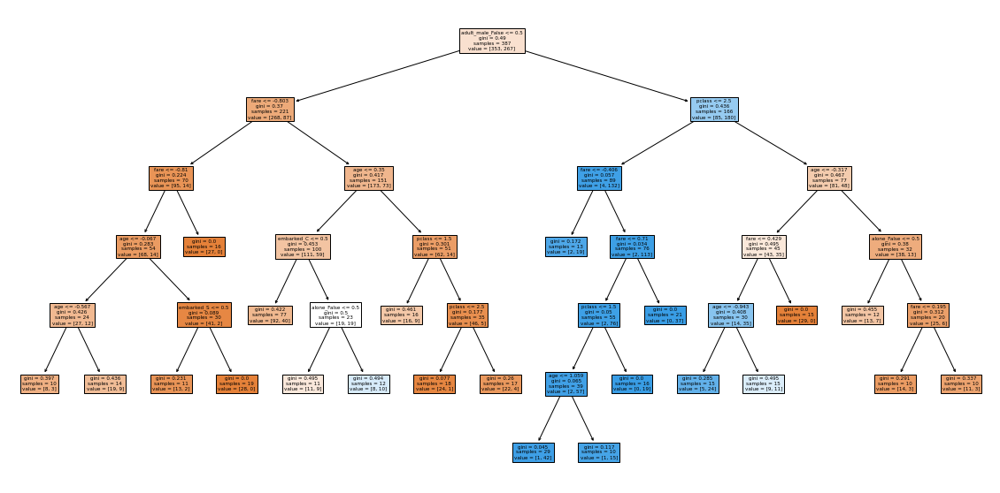


 55%|█████▌    | 55/100 [02:50<01:41,  2.26s/it]

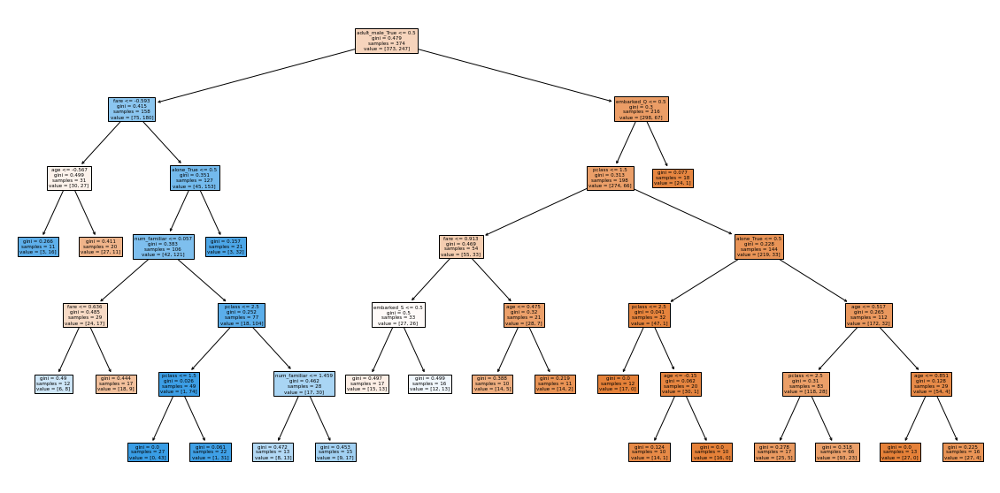


 56%|█████▌    | 56/100 [02:56<02:28,  3.38s/it]

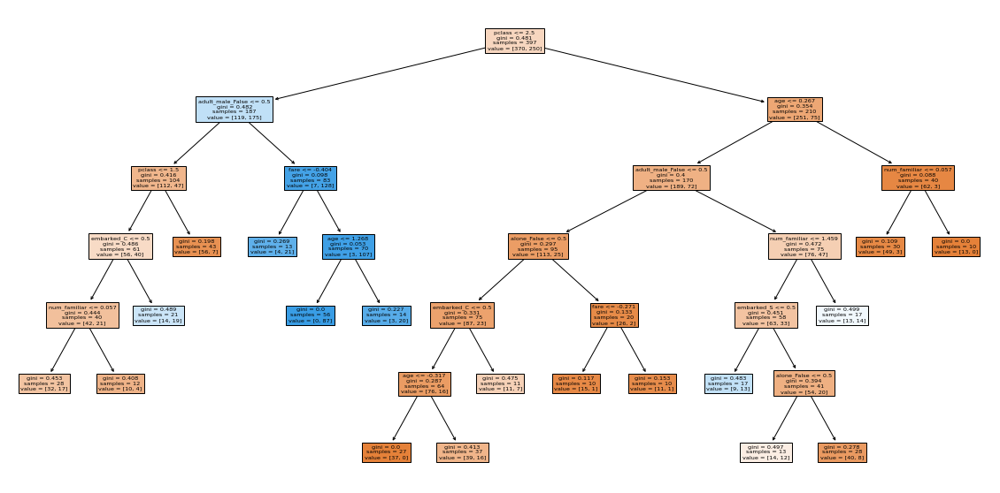


 57%|█████▋    | 57/100 [03:00<02:44,  3.84s/it]

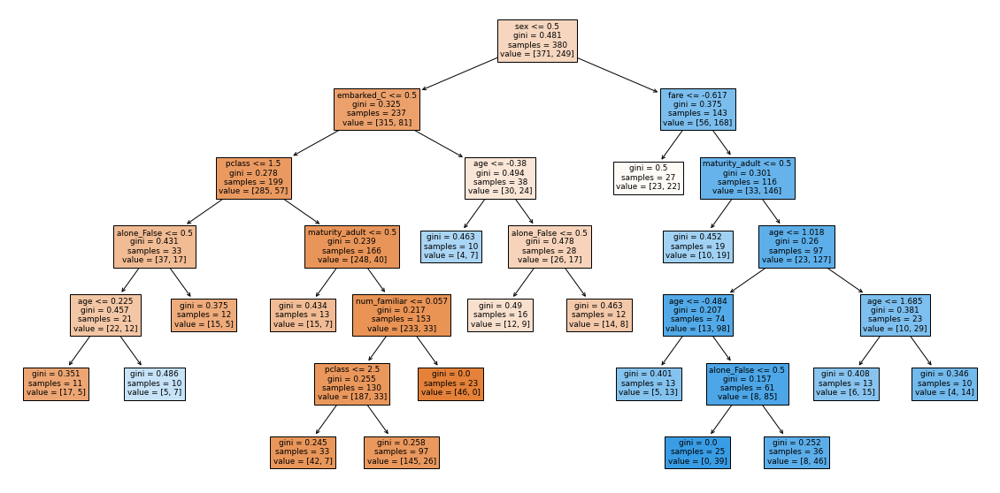


 58%|█████▊    | 58/100 [03:05<02:49,  4.05s/it]

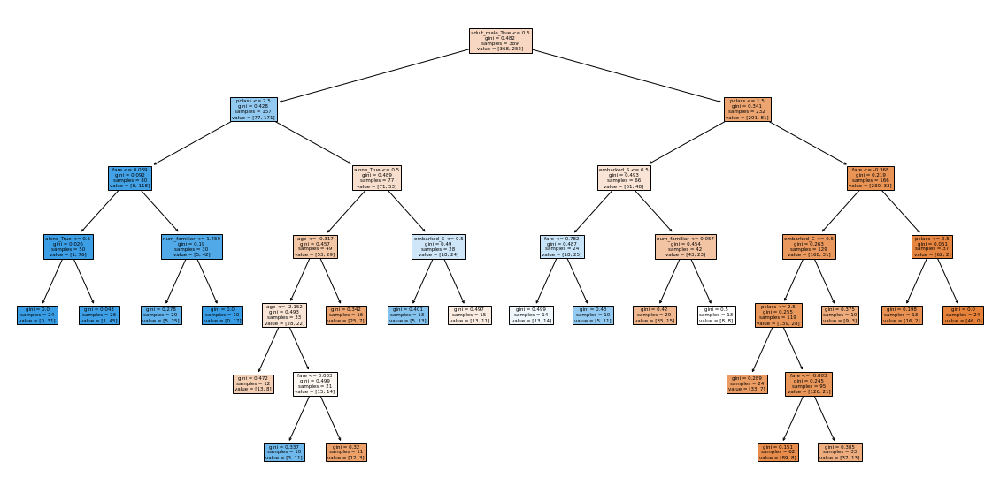


 59%|█████▉    | 59/100 [03:09<02:47,  4.10s/it]

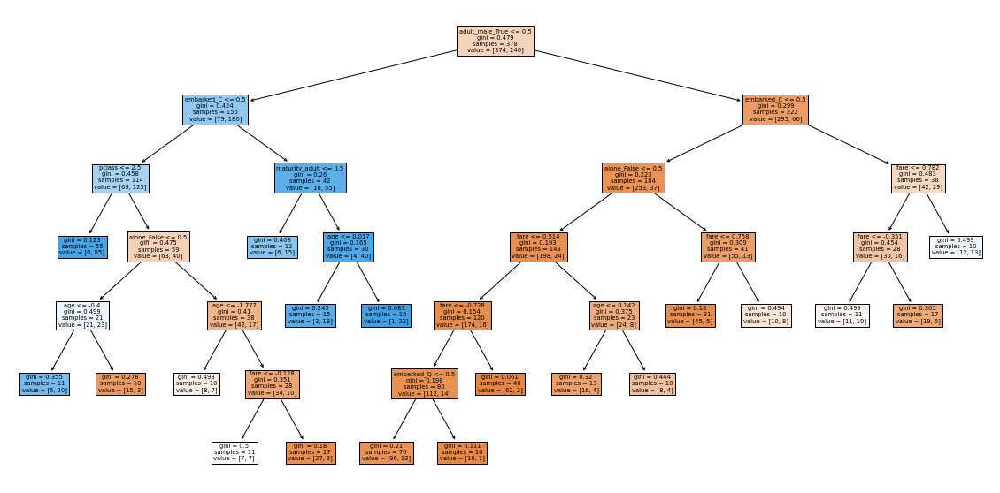


 60%|██████    | 60/100 [03:13<02:34,  3.86s/it]

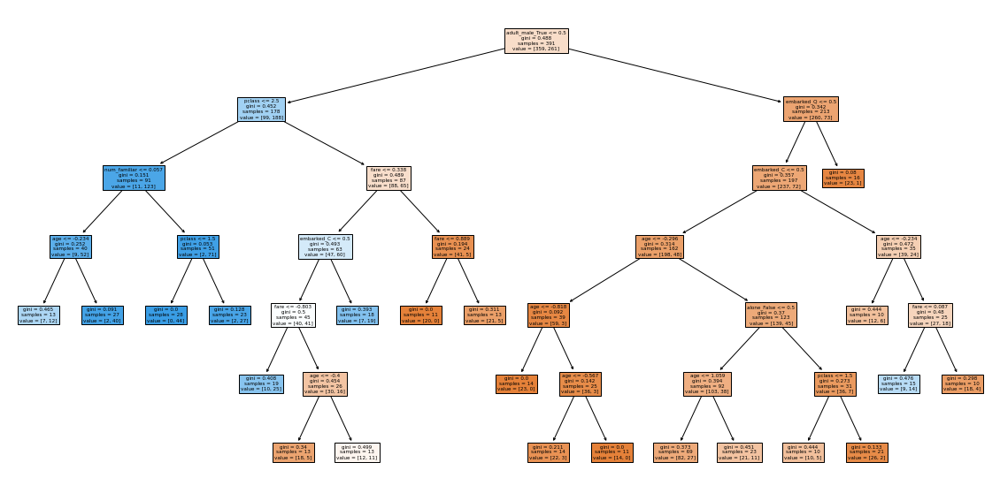


 61%|██████    | 61/100 [03:16<02:25,  3.74s/it]

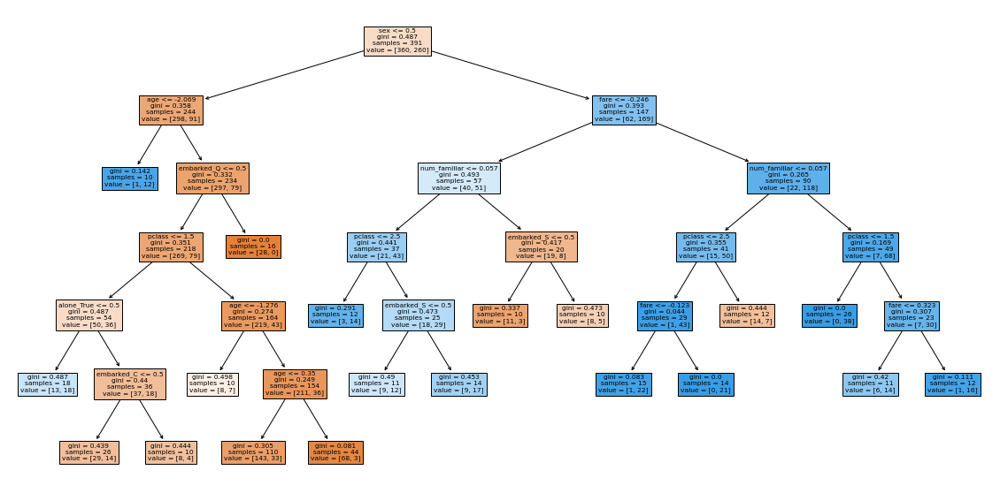


 62%|██████▏   | 62/100 [03:19<02:15,  3.57s/it]

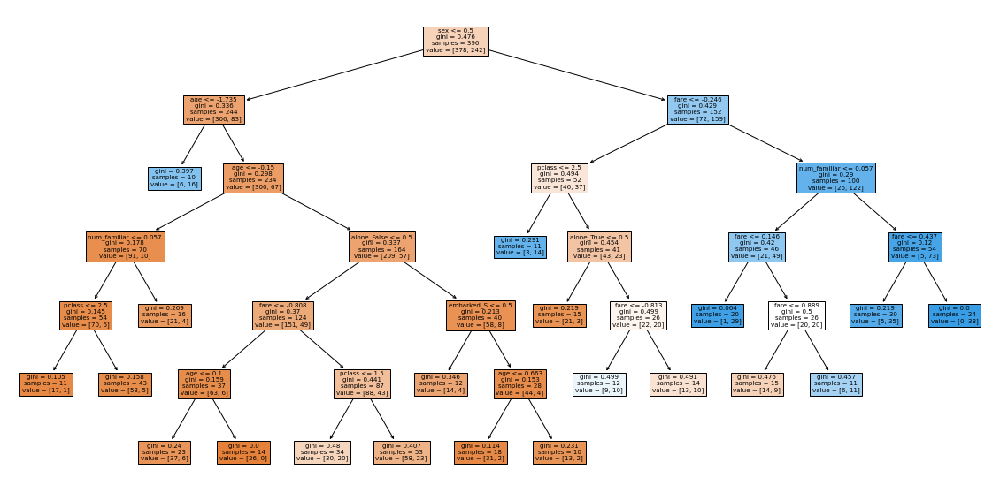


 63%|██████▎   | 63/100 [03:23<02:10,  3.53s/it]

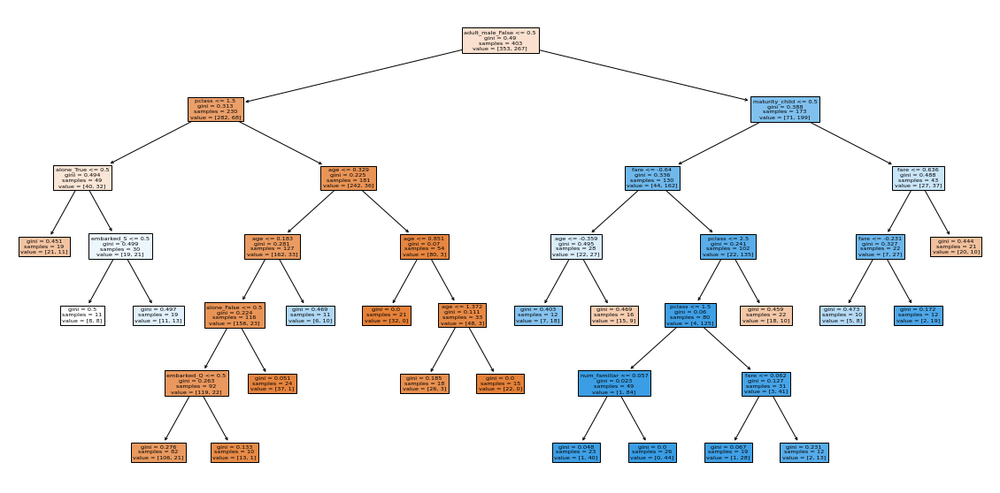


 64%|██████▍   | 64/100 [03:26<02:04,  3.47s/it]

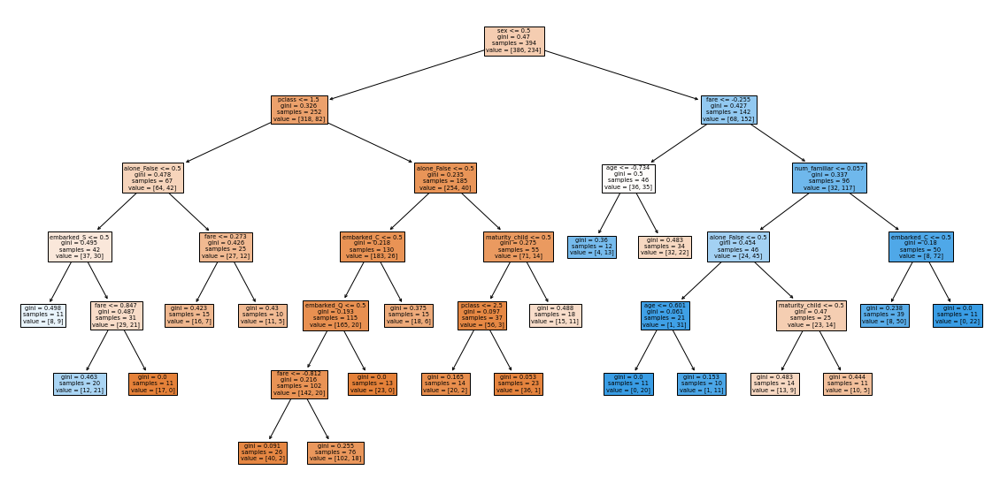


 65%|██████▌   | 65/100 [03:29<01:59,  3.41s/it]

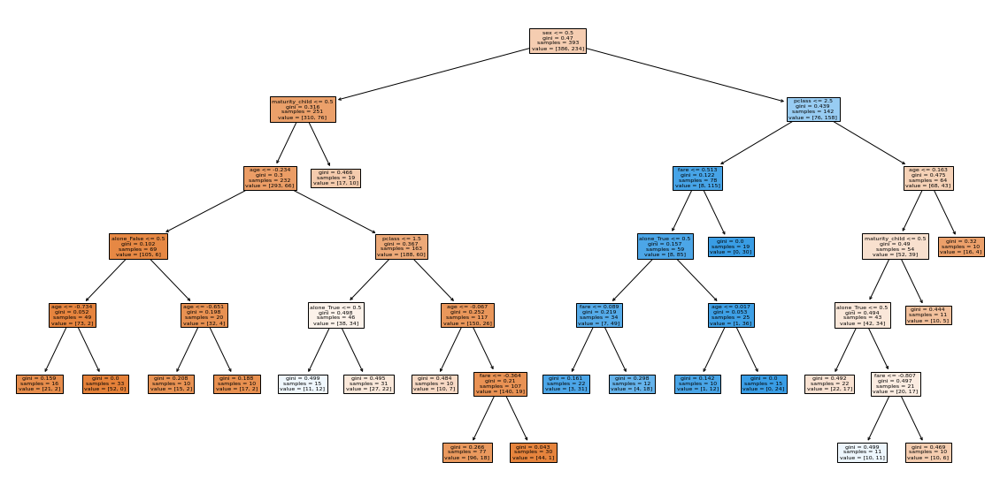


 66%|██████▌   | 66/100 [03:32<01:54,  3.36s/it]

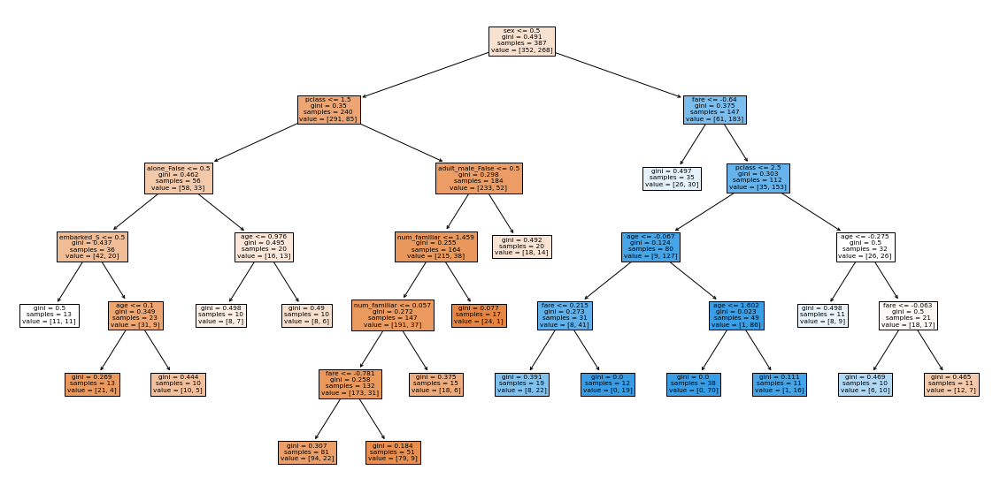


 67%|██████▋   | 67/100 [03:35<01:47,  3.26s/it]

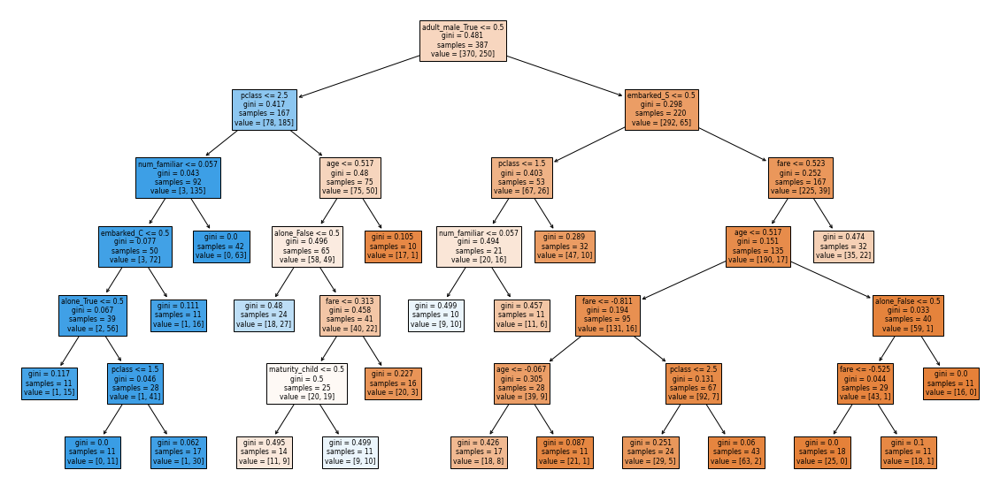


 68%|██████▊   | 68/100 [03:39<01:46,  3.33s/it]

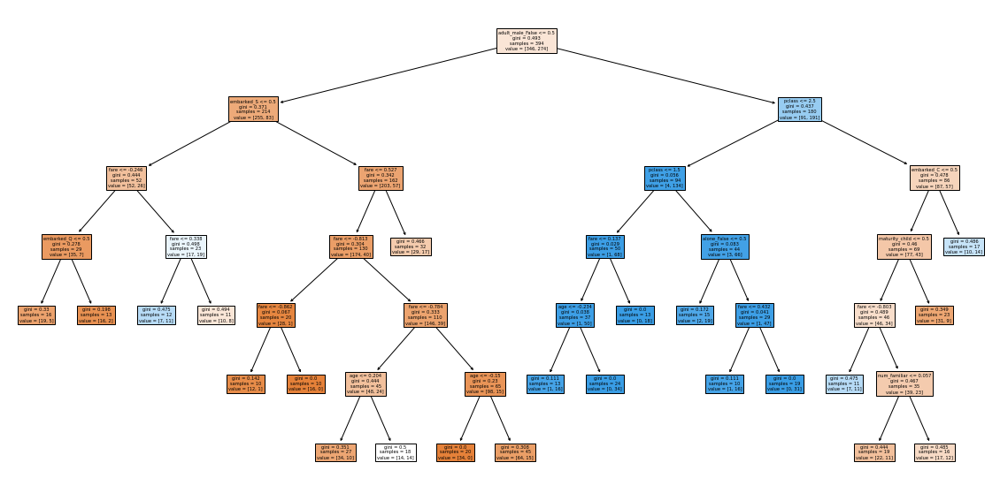


 69%|██████▉   | 69/100 [03:43<01:46,  3.42s/it]

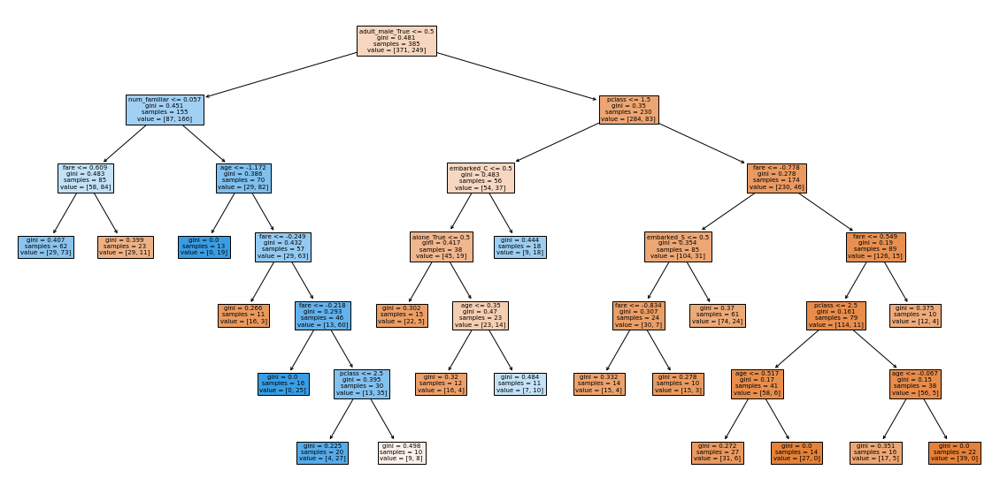


 70%|███████   | 70/100 [03:45<01:37,  3.25s/it]

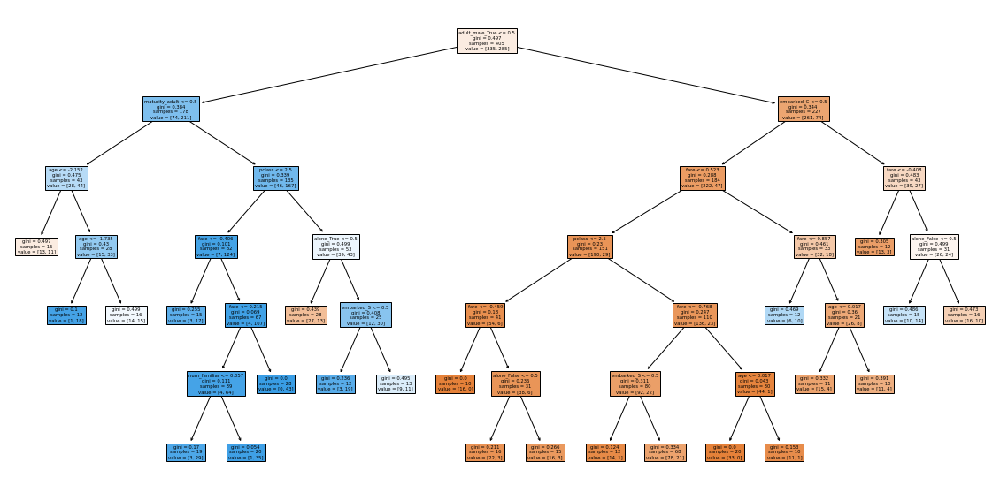


 71%|███████   | 71/100 [03:49<01:39,  3.44s/it]

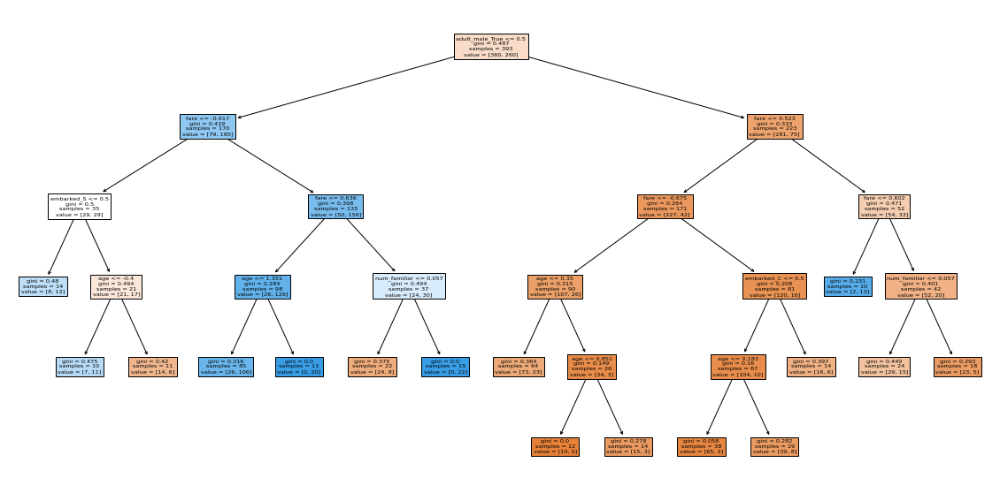


 72%|███████▏  | 72/100 [03:52<01:30,  3.23s/it]

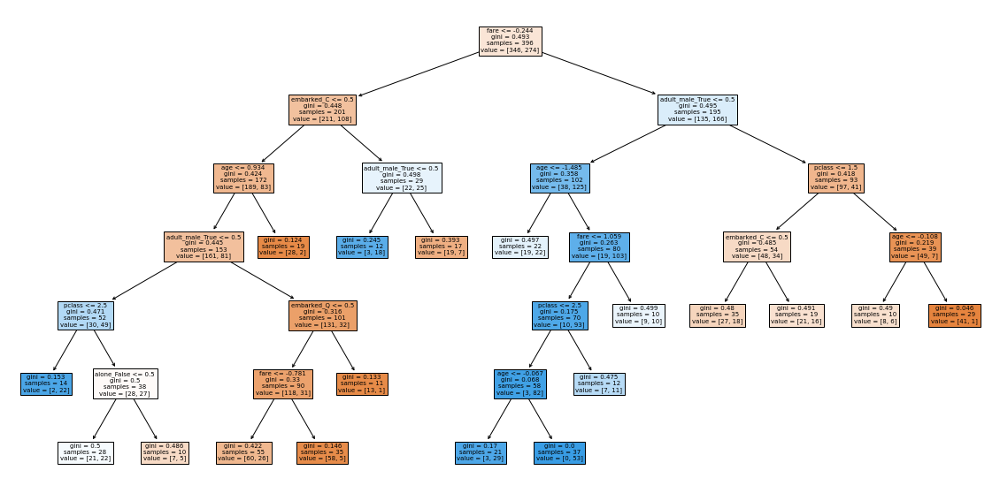


 73%|███████▎  | 73/100 [03:55<01:25,  3.17s/it]

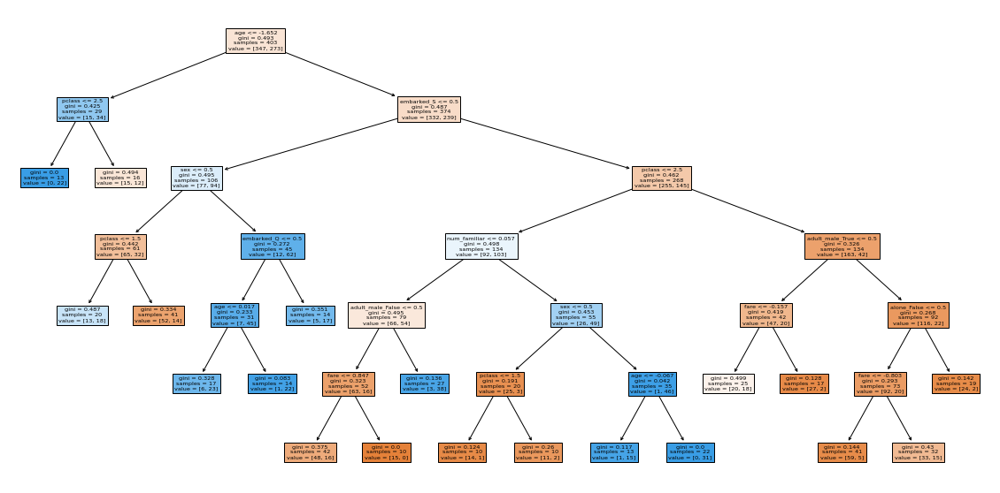


 74%|███████▍  | 74/100 [03:58<01:23,  3.21s/it]

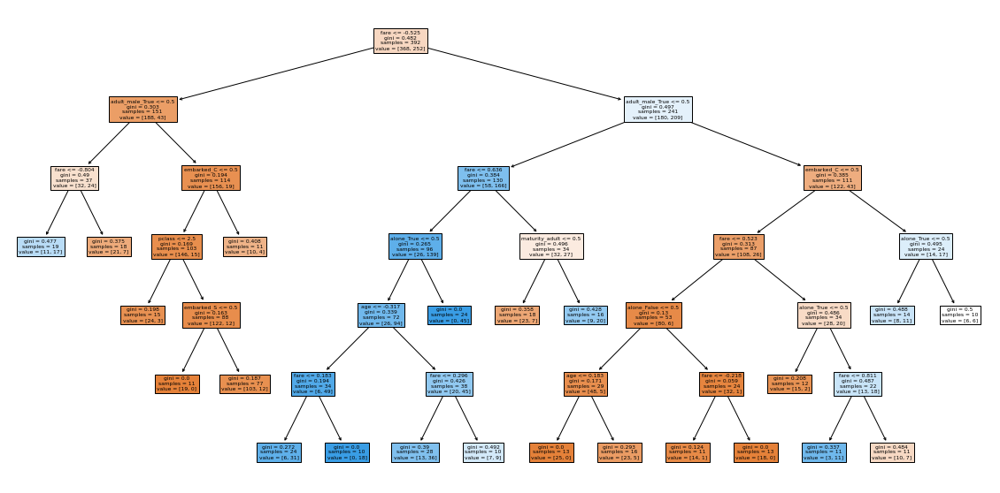


 75%|███████▌  | 75/100 [04:02<01:23,  3.33s/it]

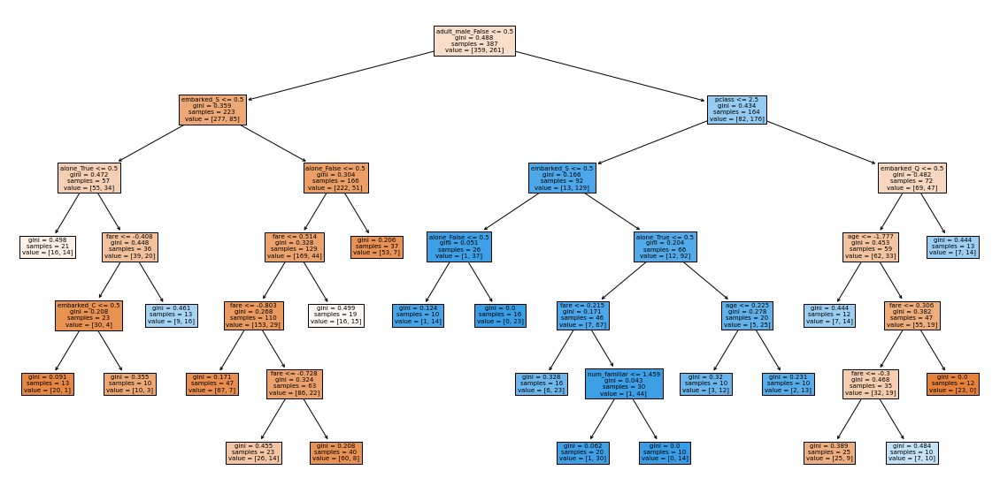


 76%|███████▌  | 76/100 [04:06<01:21,  3.38s/it]

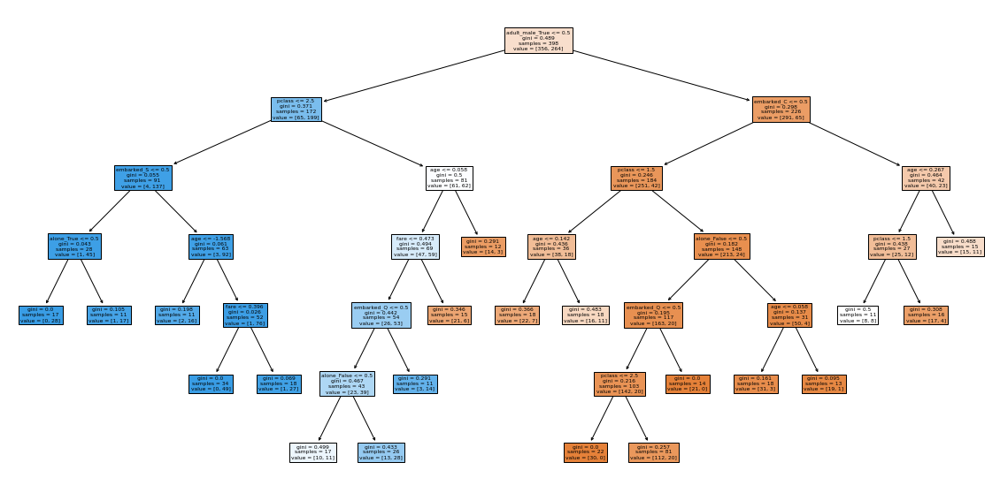


 77%|███████▋  | 77/100 [04:09<01:17,  3.38s/it]

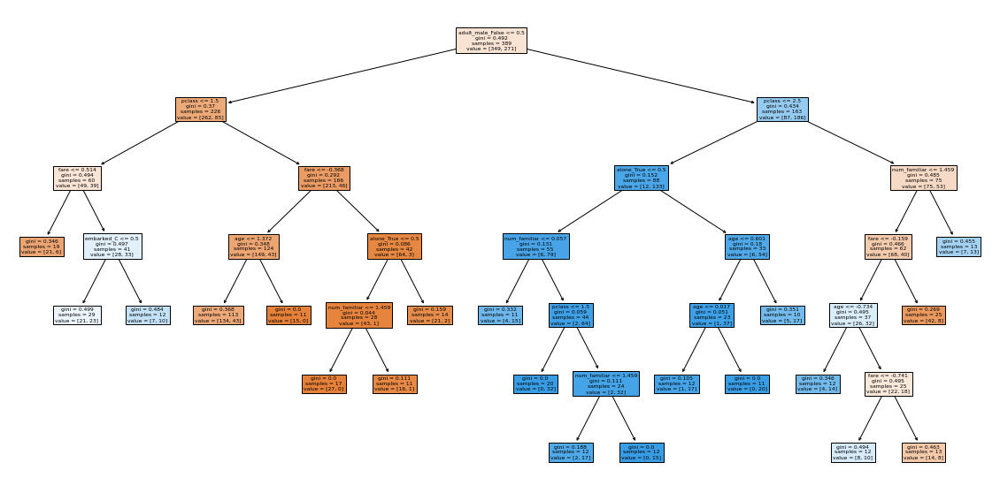


 78%|███████▊  | 78/100 [04:12<01:15,  3.45s/it]

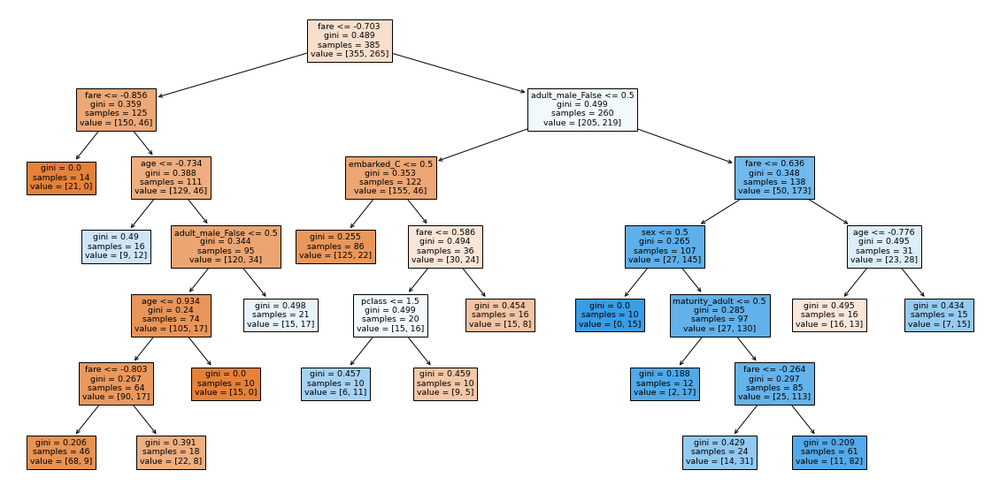


 79%|███████▉  | 79/100 [04:15<01:07,  3.20s/it]

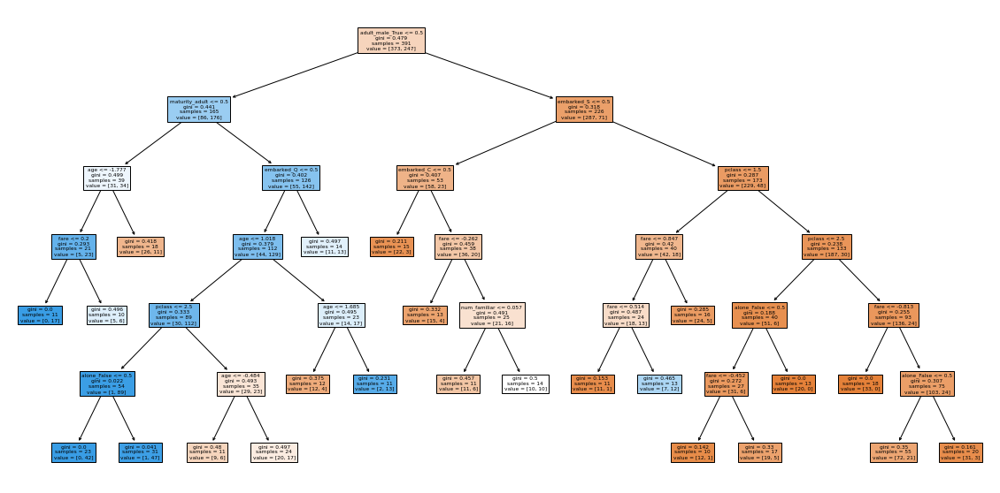


 80%|████████  | 80/100 [04:17<00:57,  2.87s/it]

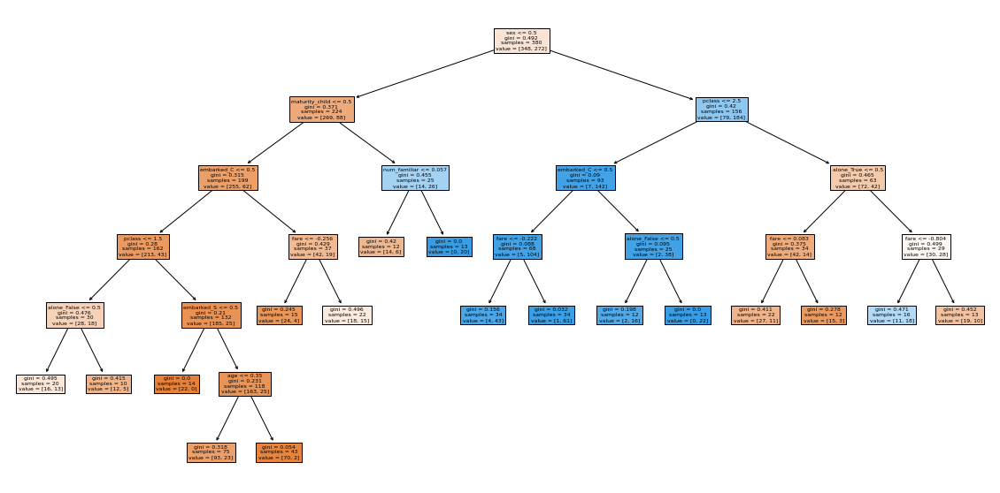


 81%|████████  | 81/100 [04:19<00:46,  2.46s/it]

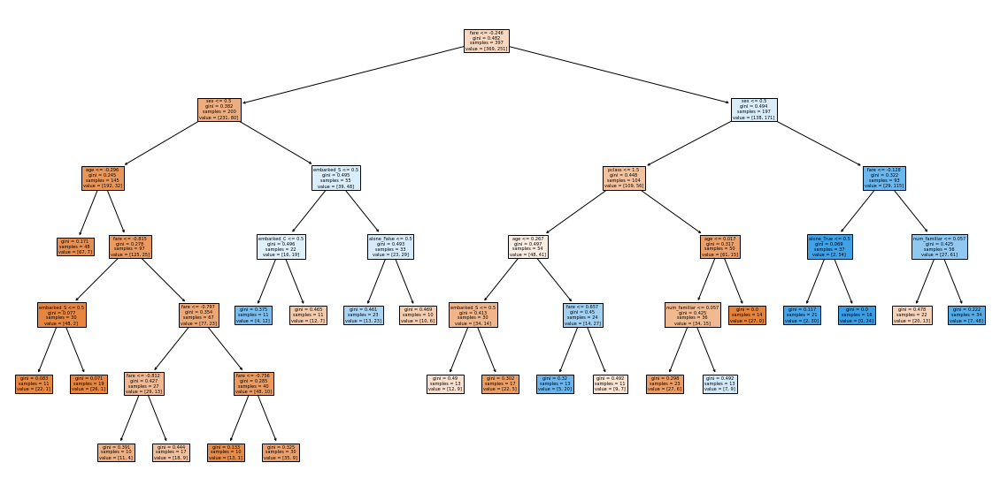


 82%|████████▏ | 82/100 [04:21<00:42,  2.34s/it]

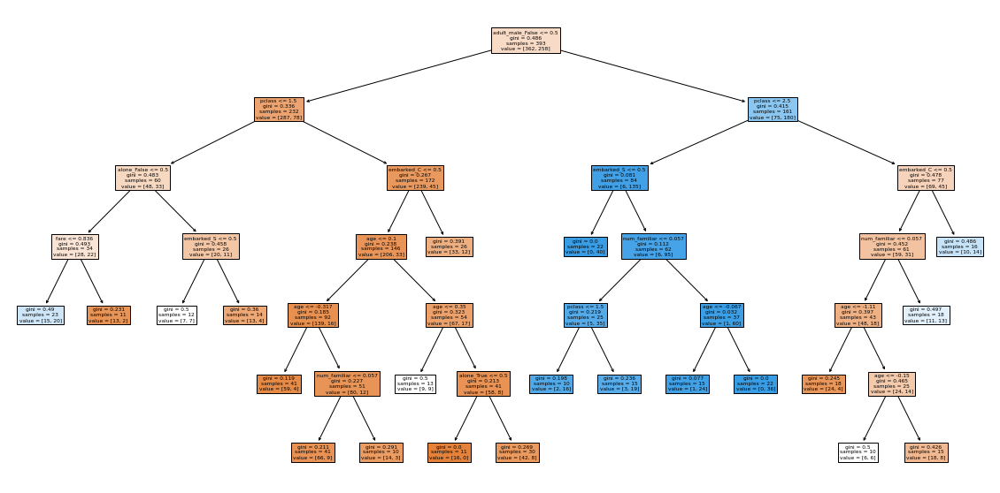


 83%|████████▎ | 83/100 [04:23<00:39,  2.31s/it]

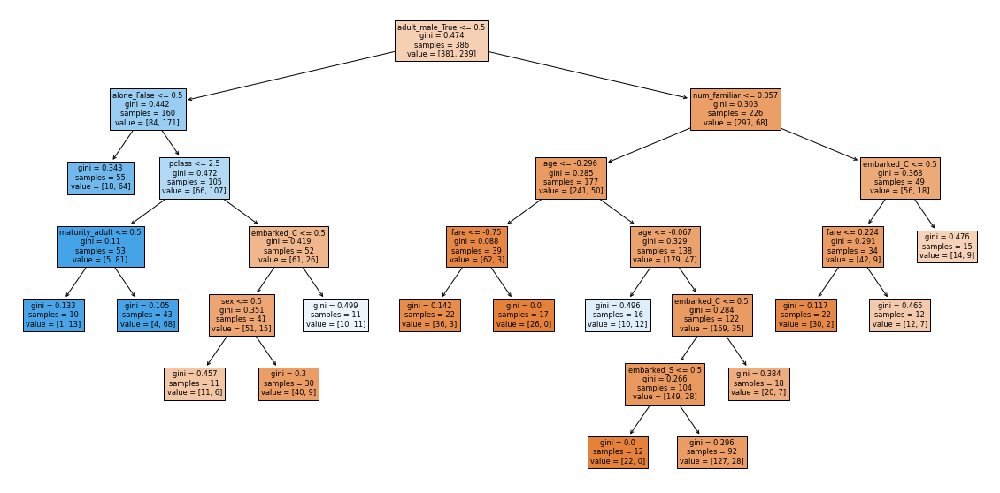


 84%|████████▍ | 84/100 [04:25<00:34,  2.17s/it]

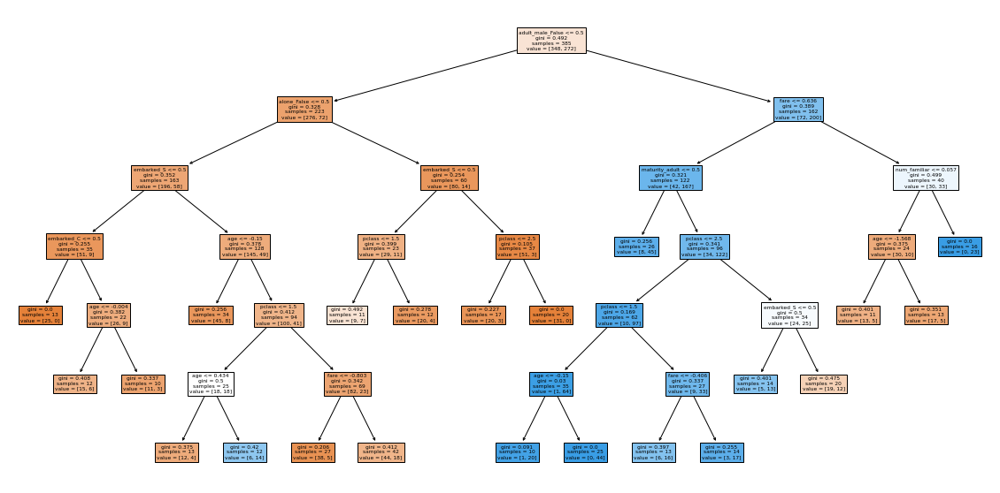


 85%|████████▌ | 85/100 [04:27<00:31,  2.10s/it]

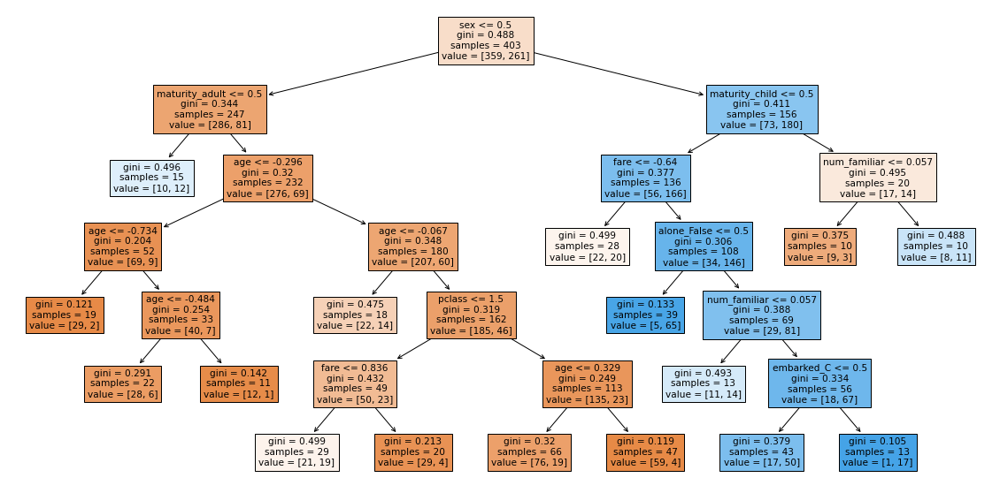


 86%|████████▌ | 86/100 [04:29<00:29,  2.14s/it]

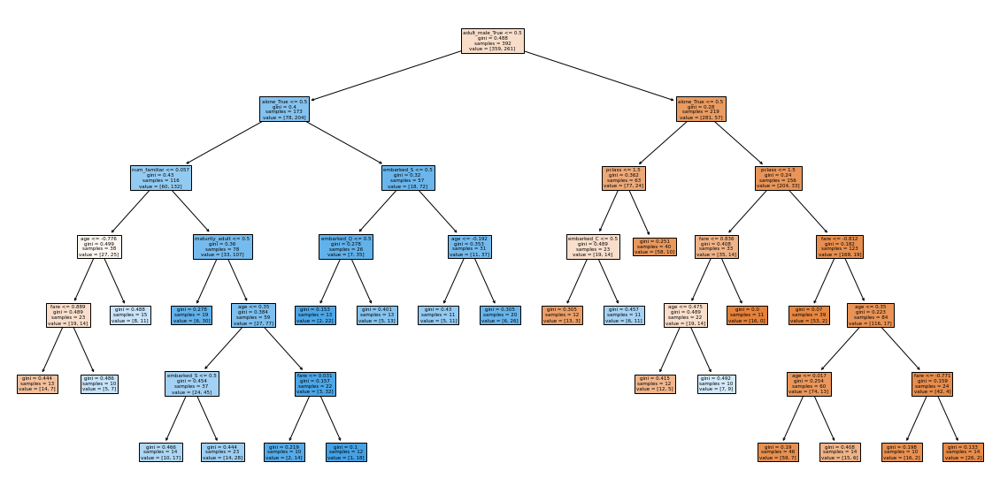


 87%|████████▋ | 87/100 [04:33<00:33,  2.54s/it]

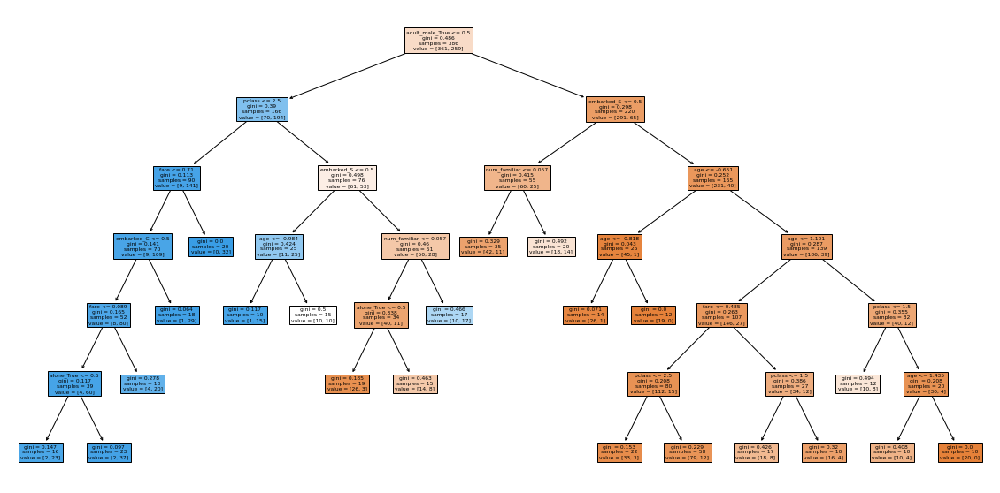


 88%|████████▊ | 88/100 [04:36<00:33,  2.81s/it]

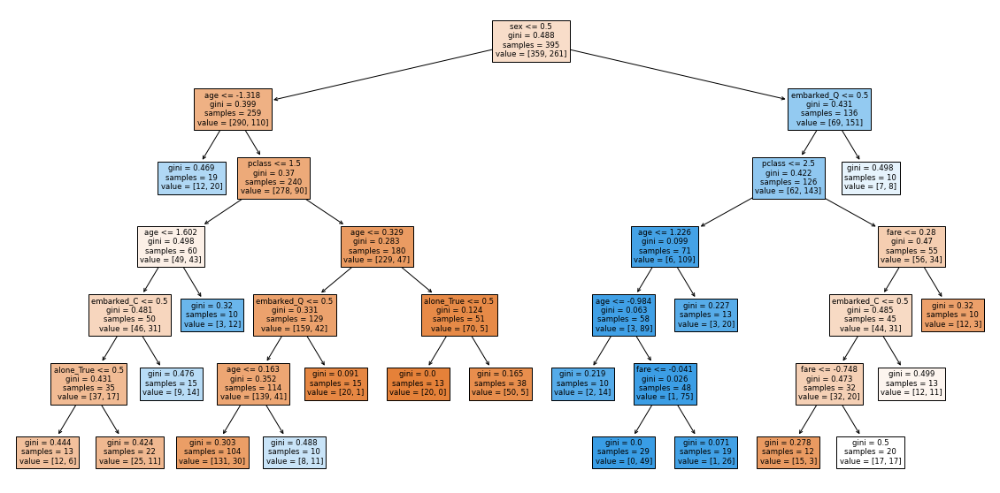


 89%|████████▉ | 89/100 [04:39<00:31,  2.89s/it]

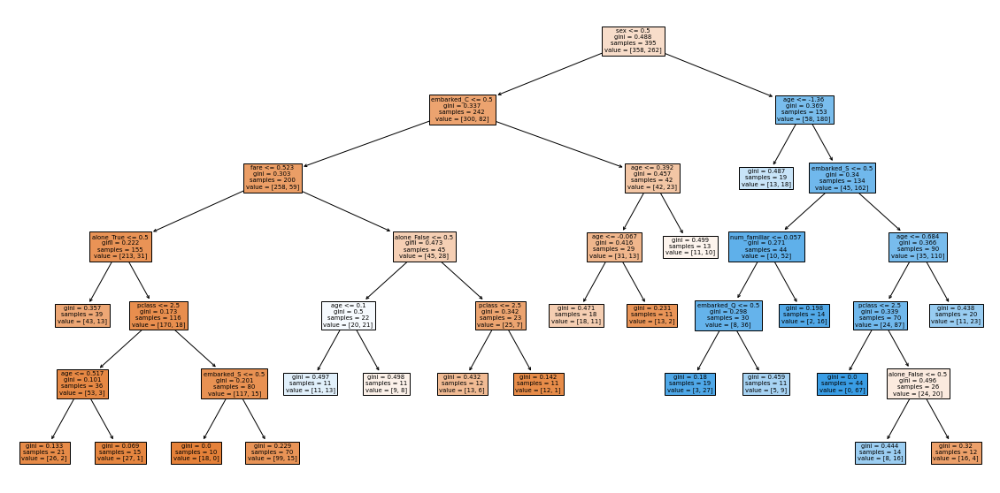


 90%|█████████ | 90/100 [04:42<00:30,  3.06s/it]

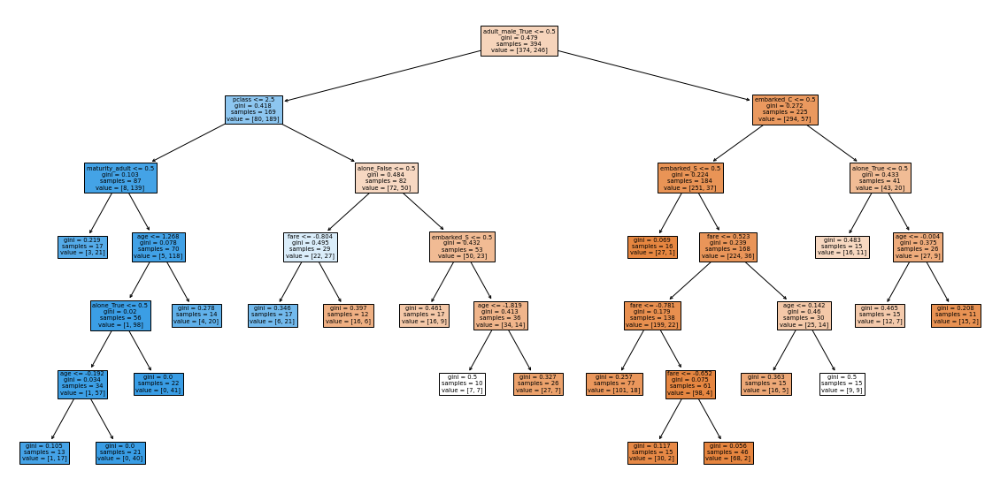


 91%|█████████ | 91/100 [04:46<00:27,  3.08s/it]

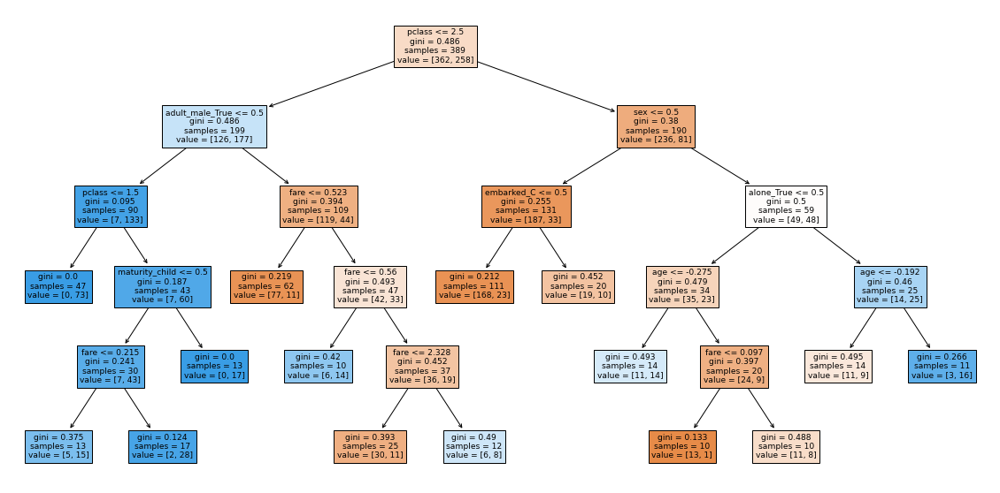


 92%|█████████▏| 92/100 [04:48<00:22,  2.85s/it]

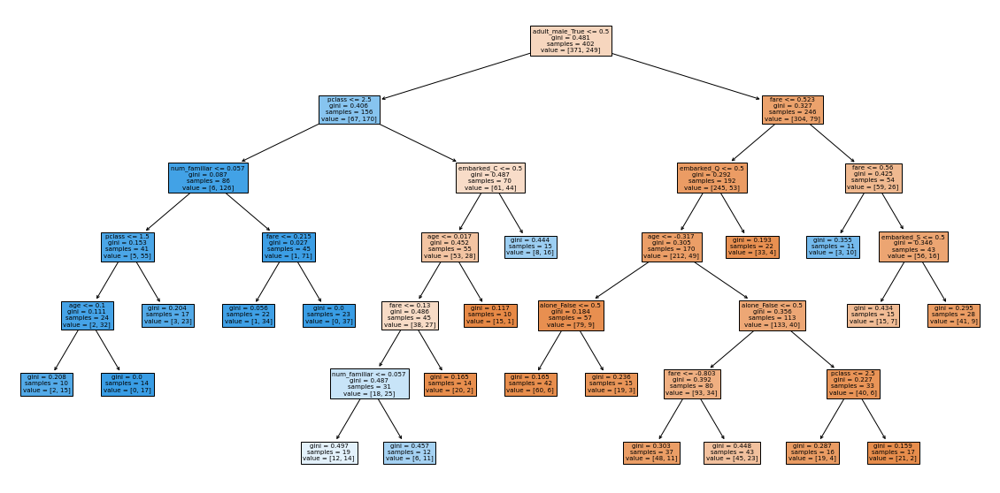


 93%|█████████▎| 93/100 [04:51<00:20,  2.90s/it]

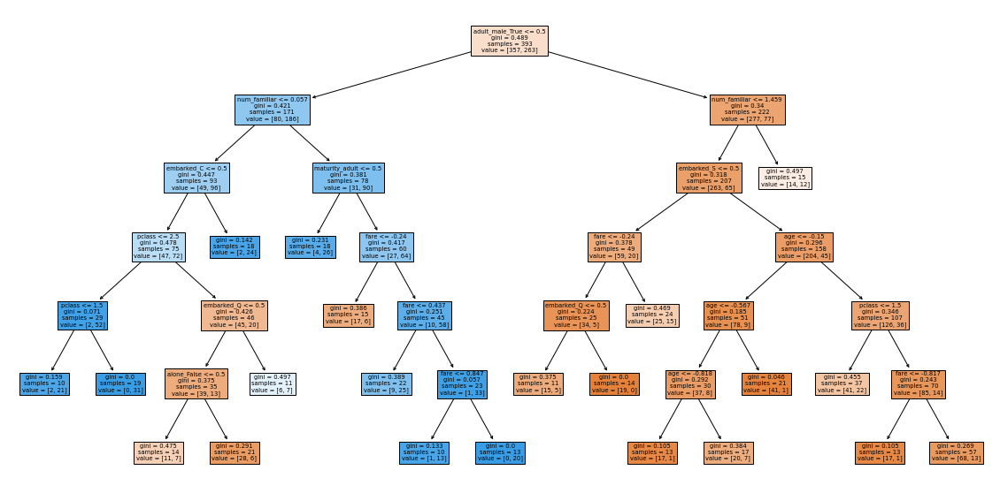


 94%|█████████▍| 94/100 [04:54<00:18,  3.03s/it]

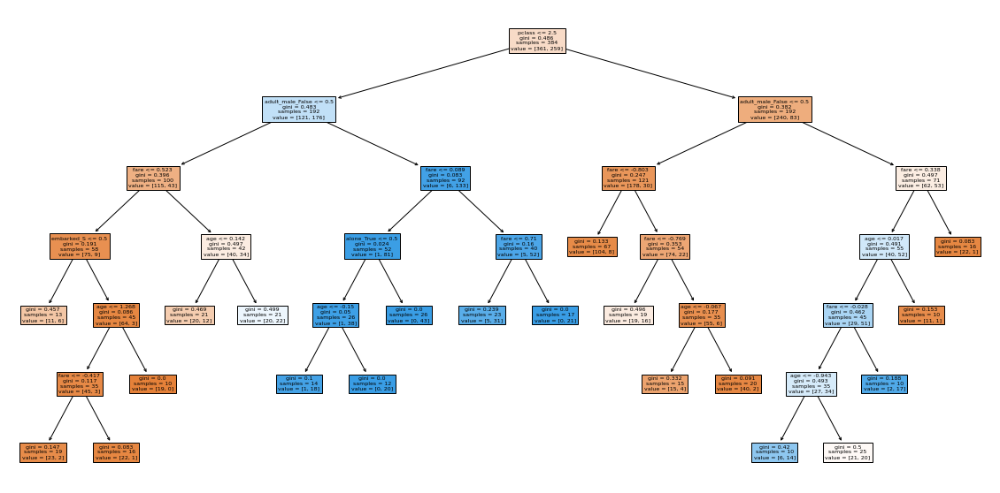


 95%|█████████▌| 95/100 [04:58<00:15,  3.10s/it]

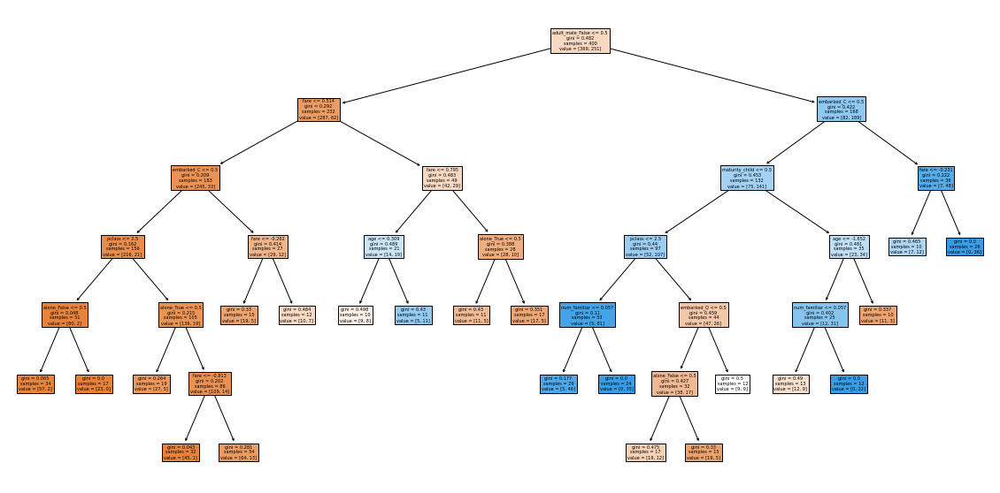


 96%|█████████▌| 96/100 [05:01<00:12,  3.06s/it]

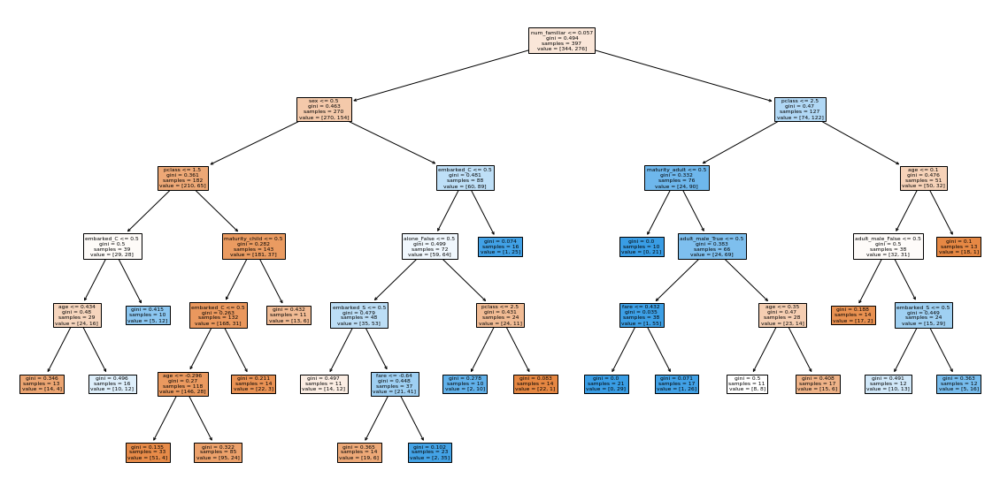


 97%|█████████▋| 97/100 [05:04<00:09,  3.26s/it]

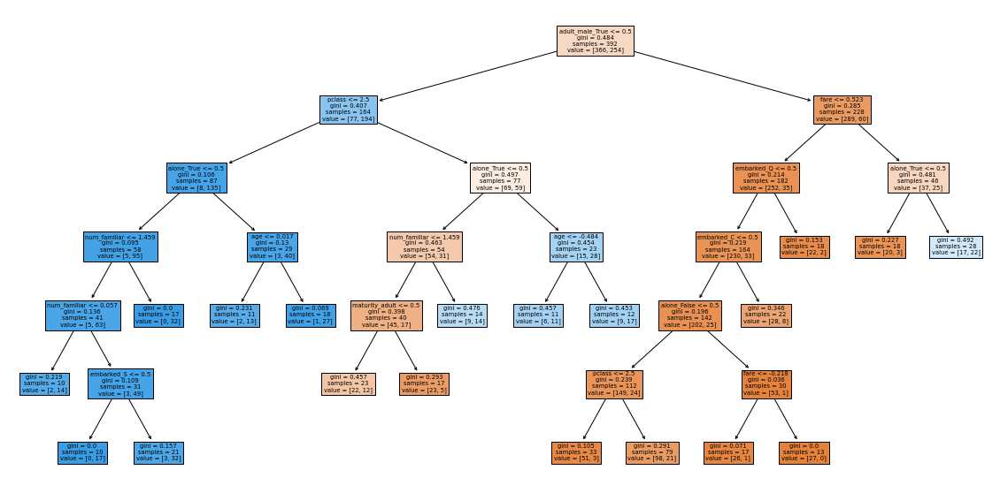


 98%|█████████▊| 98/100 [05:07<00:06,  3.19s/it]

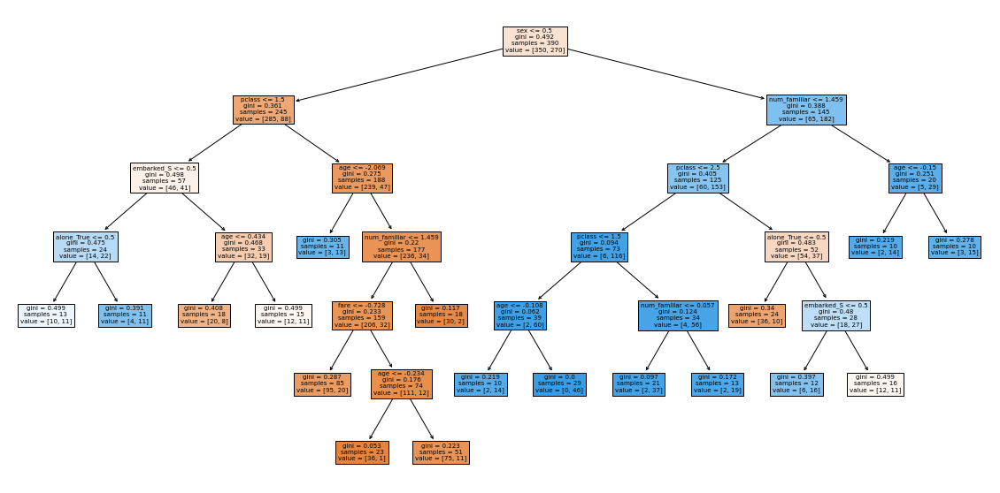


 99%|█████████▉| 99/100 [05:10<00:03,  3.11s/it]

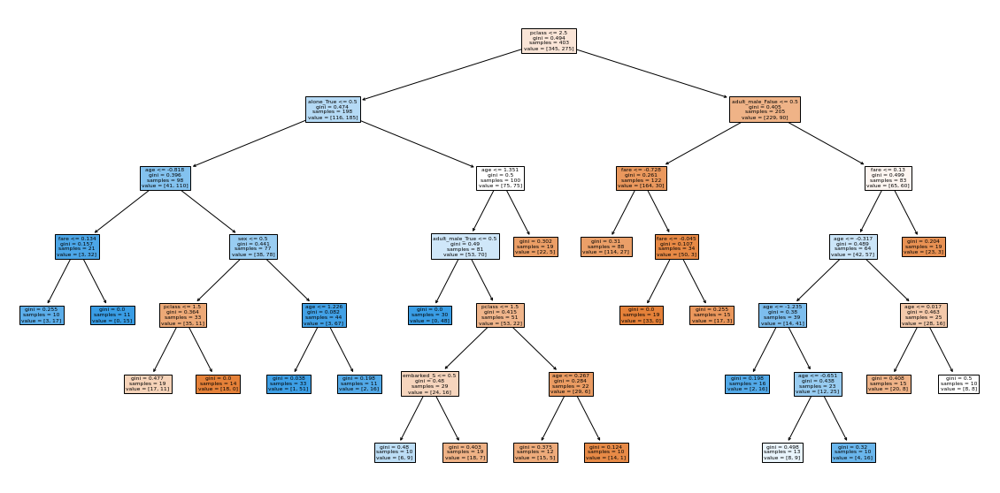

100%|██████████| 100/100 [05:13<00:00,  3.14s/it]


In [9]:
# dibujemos los árboles de nuestro bosque

for arbol in tqdm(bosque.estimators_):
    fig = plt.figure(figsize=(20, 10))
    tree.plot_tree(arbol, feature_names= x_train.columns, filled = True)
    plt.show()

Ya tenemos nuestro bosque y hemos visto todos sus árboles, el siguiente paso, como hasta ahora es calcular sus métricas para ver como de bueno es nuestro modelo prediciendo:

In [10]:
y_pred_test_rf = bosque.predict(x_test)
y_pred_train_rf = bosque.predict(x_train)

In [11]:
def metricas(clases_reales_test, clases_predichas_test, clases_reales_train, clases_predichas_train, modelo):
    
    # para el test
    accuracy_test = accuracy_score(clases_reales_test, clases_predichas_test)
    precision_test = precision_score(clases_reales_test, clases_predichas_test)
    recall_test = recall_score(clases_reales_test, clases_predichas_test)
    f1_test = f1_score(clases_reales_test, clases_predichas_test)
    kappa_test = cohen_kappa_score(clases_reales_test, clases_predichas_test)

    # para el train
    accuracy_train = accuracy_score(clases_reales_train, clases_predichas_train)
    precision_train = precision_score(clases_reales_train, clases_predichas_train)
    recall_train = recall_score(clases_reales_train, clases_predichas_train)
    f1_train = f1_score(clases_reales_train, clases_predichas_train)
    kappa_train = cohen_kappa_score(clases_reales_train, clases_predichas_train)
    

    
    df = pd.DataFrame({"accuracy": [accuracy_test, accuracy_train], 
                       "precision": [precision_test, precision_train],
                       "recall": [recall_test, recall_train], 
                       "f1": [f1_test, f1_train],
                       "kapppa": [kappa_test, kappa_train],
                       "set": ["test", "train"]})
    
    df["modelo"] = modelo
    return df

In [12]:
# sacamos las métricas para ver si hay overfitting o unerfitting, para modificar la profundidad en función de estos resultados

dt_results = metricas(y_test, y_pred_test_rf,y_train,  y_pred_train_rf, "Random Forest")
dt_results

,accuracy,precision,recall,f1,kapppa,set,modelo
0,0.838710,0.888889,0.666667,0.761905,0.643678,test,Random Forest
1,0.825806,0.876238,0.680769,0.766234,0.630871,train,Random Forest


In [13]:
# igual que en la clase de decision tree, juntemos estos resultados con los obtenidos en los modelos que hemos hecho hasta ahora
# lo primero que tenemos que hacer es cargar el csv con todos los resultados que guardamos en el jupyter anterior

df_LR_DT_results = pd.read_csv("../files/resultados_titanic_LR_DT.csv", index_col = 0)
df_LR_DT_results

,accuracy,precision,recall,f1,kapppa,set,modelo
2,0.767742,0.700000,0.700000,0.700000,0.510526,test,Regresión logistica Esta
3,0.801613,0.781893,0.730769,0.755467,0.588895,train,Regresión logistica Esta
6,0.825806,0.883721,0.633333,0.737864,0.612679,test,Decision tree Esta II
7,0.795161,0.859459,0.611538,0.714607,0.561825,train,Decision tree Esta II


In [15]:
# concatenamos el csv anterior con los resultados obtenidos en este modelo

df_todos_resultados = pd.concat([dt_results, df_LR_DT_results], axis = 0)
df_todos_resultados

,accuracy,precision,recall,f1,kapppa,set,modelo
0,0.838710,0.888889,0.666667,0.761905,0.643678,test,Random Forest
1,0.825806,0.876238,0.680769,0.766234,0.630871,train,Random Forest
2,0.767742,0.700000,0.700000,0.700000,0.510526,test,Regresión logistica Esta
3,0.801613,0.781893,0.730769,0.755467,0.588895,train,Regresión logistica Esta
6,0.825806,0.883721,0.633333,0.737864,0.612679,test,Decision tree Esta II
7,0.795161,0.859459,0.611538,0.714607,0.561825,train,Decision tree Esta II


De nuevo, ¿cuál es el modelo que mejor predice de todos los que hemos ejecutado? Lo discutiremos en la clase de mañana después del kahoot!

In [16]:
df_todos_resultados.style.background_gradient(cmap='seismic')

,accuracy,precision,recall,f1,kapppa,set,modelo
0,0.838710,0.888889,0.666667,0.761905,0.643678,test,Random Forest
1,0.825806,0.876238,0.680769,0.766234,0.630871,train,Random Forest
2,0.767742,0.700000,0.700000,0.700000,0.510526,test,Regresión logistica Esta
3,0.801613,0.781893,0.730769,0.755467,0.588895,train,Regresión logistica Esta
6,0.825806,0.883721,0.633333,0.737864,0.612679,test,Decision tree Esta II
7,0.795161,0.859459,0.611538,0.714607,0.561825,train,Decision tree Esta II


Por último, nos queda chequear cuál es importancia de cada una de las variables que tenemos en nuestro modelo. Recordemos que teniamos el método `feature_importance_`, este método nos decía como de importantes son cada una de nuestras variables en nuestro modelo. 

In [28]:

# vamos a crearnos un dataframe, igual que hicimos en la clase anterior con la importancia de cada una de las variables incluidas en el modelo

importancia_predictores = pd.DataFrame(
                            {'predictor': x_train.columns,
                             'importancia': bosque.feature_importances_}
                            )


# ordenamos de mayor a menor los resultados
importancia_predictores.sort_values(by=["importancia"], ascending=False, inplace = True)

# printeamos los resultados
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
11,adult_male_True,0.229187
0,pclass,0.209428
10,adult_male_False,0.170675
1,sex,0.136917
3,fare,0.106597
2,age,0.056457
4,num_familiar,0.026817
5,embarked_C,0.020035
7,embarked_S,0.010897
13,alone_True,0.010496


Al igual que con el *Decision Tree* cada columna de nuestro *dataframe*  tiene un valor, pero algunas columnas las habíamos convertido a `get_dummies` lo que nos devolvía varias columnas para una misma columna. Unifiquemoslas! 

In [29]:
# lo primero que hacemos es crearnos un dataframe con los valores solo de adulto, es decir, la primera y antepenúltima fila
adulto = importancia_predictores.iloc[[0, 2]]
adulto

,predictor,importancia
11,adult_male_True,0.229187
10,adult_male_False,0.170675


In [30]:
# seguimos con embarque

embarque = importancia_predictores.loc[[5,7]]
embarque

,predictor,importancia
5,embarked_C,0.020035
7,embarked_S,0.010897


In [31]:
# y para maturity
madurez = importancia_predictores.loc[[8,9]]
madurez

,predictor,importancia
8,maturity_adult,0.005145
9,maturity_child,0.006404


In [32]:
# y por último para saber si viajaban solos o no
# hacemos lo mismo para embarque
solos = importancia_predictores.loc[[12,13]]
solos

,predictor,importancia
12,alone_False,0.007757
13,alone_True,0.010496


In [33]:
# eliminamos esas filas del dataframe donde tenemos los valores de importancia

importancia_predictores.drop(adulto.index, inplace = True)
importancia_predictores.drop(madurez.index, inplace = True)
importancia_predictores.drop(embarque.index, inplace = True)
importancia_predictores.drop(solos.index, inplace = True)

In [34]:
# nos creamos nuevas filas con el resultado de la suma

importancia_predictores.loc[5] =  ["adult_male", adulto["importancia"].sum()]
importancia_predictores.loc[6] =  ["maturity", madurez["importancia"].sum()]
importancia_predictores.loc[7] =  ["embark", embarque["importancia"].sum()]
importancia_predictores.loc[8] =  ["alone", solos["importancia"].sum()]

# ordenamos el df

importancia_predictores.sort_values(by = "importancia", ascending = False, inplace = True)
importancia_predictores

,predictor,importancia
5,adult_male,0.399862
0,pclass,0.209428
1,sex,0.136917
3,fare,0.106597
2,age,0.056457
7,embark,0.030932
4,num_familiar,0.026817
8,alone,0.018253
6,maturity,0.011549


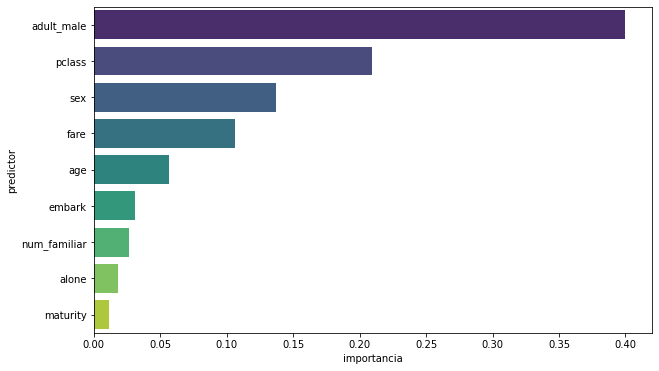

In [35]:
# por último ploteamos los resultados para verlo de una forma más amigable. 

plt.figure(figsize=(10,6))
sns.barplot(x = "importancia", y = "predictor", data = importancia_predictores, palette="viridis");
plt.show()